In [22]:
# STEP 1 – Loading Raw K-index Data
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

k_index_path = "C:/Users/Acer/Documents/Subjects/INFO580-MBusDataSc Research Project/Predicting Geomagnetic Storms/Data/EYR_2014_k.txt"

# Loading file
k_df_raw = pd.read_csv(
    k_index_path,
    comment="#",
    sep=r"\s+",
    header=None,
    skiprows=10,
    names=["STA", "YR", "MTH", "DAY", "1", "2", "3", "4", "5", "6", "7", "8"],
    dtype=str
)

# Drop empty rows before filtering numeric
k_df_raw = k_df_raw.dropna(subset=["YR"])
k_df_raw = k_df_raw[k_df_raw["YR"].str.isnumeric()]

# Convert types
k_df_raw["YR"] = k_df_raw["YR"].astype(int)
k_df_raw["MTH"] = k_df_raw["MTH"].astype(int)
k_df_raw["DAY"] = k_df_raw["DAY"].astype(int)

# Replace -1 with NaN in K-values
k_columns = ["1", "2", "3", "4", "5", "6", "7", "8"]
k_df_raw[k_columns] = k_df_raw[k_columns].replace("-1", np.nan).astype(float)

# STEP 2 – Show Table WITH January (Before Drop)

print("K-index table BEFORE dropping January (shows missing values as NaN):")
display(k_df_raw[["YR", "MTH", "DAY"] + k_columns].head(50))

# Count missing values BEFORE dropping Jan
missing_before = k_df_raw[k_columns].isna().sum().sum()
print(f"Total missing values before dropping January: {missing_before}")

# STEP 3 – Drop January (Keeping Feb–Dec)
k_df = k_df_raw[k_df_raw["MTH"] != 1].copy()

# STEP 4 – KNN Imputation
imputer = KNNImputer(n_neighbors=5)
k_df[k_columns] = imputer.fit_transform(k_df[k_columns])

# Adding date for index
k_df["date"] = pd.to_datetime(dict(year=k_df["YR"], month=k_df["MTH"], day=k_df["DAY"]))
k_df.set_index("date", inplace=True)

# Restoring `k_long` from KNN-imputed k_df
k_columns = ["1", "2", "3", "4", "5", "6", "7", "8"]

k_long = k_df.reset_index().melt(
    id_vars=["YR", "MTH", "DAY", "date"],
    value_vars=k_columns,
    var_name="interval",
    value_name="k_value"
)

k_long["interval"] = k_long["interval"].astype(int)
k_long["hour_offset"] = (k_long["interval"] - 1) * 3
k_long["datetime"] = pd.to_datetime(k_long["date"]) + pd.to_timedelta(k_long["hour_offset"], unit="h")
k_long = k_long.sort_values("datetime").reset_index(drop=True)

# STEP 5 – Add 3-hour Interval `datetime` to `k_long`
# Ensuring 'interval' is integer
k_long["interval"] = k_long["interval"].astype(int)

# Calculating 3-hour offset (0h, 3h, ..., 21h)
k_long["hour_offset"] = (k_long["interval"] - 1) * 3

# Creating full datetime column
k_long["datetime"] = pd.to_datetime(k_long["date"]) + pd.to_timedelta(k_long["hour_offset"], unit="h")

# Sorting by datetime for consistency
k_long = k_long.sort_values("datetime").reset_index(drop=True)

# Showing result
print("K-index table with 3-hour datetime:")
display(k_long.head(8))

# STEP 6 – Show Imputed Table + Check Again
print("K-index table AFTER KNN imputation (Feb–Dec):")
display(k_df[k_columns].head(50))

# Checking for missing values after KNN
missing_after = k_df[k_columns].isna().sum().sum()
print(f"Total missing values AFTER KNN: {missing_after}")

# STEP 7 – Show Sample of Final Imputed Table with Datetime
print("Sample of K-index table AFTER KNN imputation (with 3-hour datetime):")
display(k_long[["YR", "MTH", "DAY", "interval", "k_value", "hour_offset", "datetime"]].head(20))




K-index table BEFORE dropping January (shows missing values as NaN):


,YR,MTH,DAY,1,2,3,4,5,6,7,8
1,2014,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2014,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2014,1,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2014,1,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2014,1,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2014,1,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,2014,1,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Total missing values before dropping January: 160
K-index table with 3-hour datetime:


,YR,MTH,DAY,date,interval,k_value,hour_offset,datetime
0,2014,2,1,2014-02-01,1,0.0,0,2014-02-01 00:00:00
1,2014,2,1,2014-02-01,2,1.0,3,2014-02-01 03:00:00
2,2014,2,1,2014-02-01,3,1.0,6,2014-02-01 06:00:00
3,2014,2,1,2014-02-01,4,0.0,9,2014-02-01 09:00:00
4,2014,2,1,2014-02-01,5,1.0,12,2014-02-01 12:00:00
5,2014,2,1,2014-02-01,6,1.0,15,2014-02-01 15:00:00
6,2014,2,1,2014-02-01,7,2.0,18,2014-02-01 18:00:00
7,2014,2,1,2014-02-01,8,2.0,21,2014-02-01 21:00:00


K-index table AFTER KNN imputation (Feb–Dec):


,1,2,3,4,5,6,7,8
date,,,,,,,,
2014-02-01,0.0,1.0,1.0,0.0,1.0,1.0,2.0,2.0
2014-02-02,1.0,2.0,2.0,0.0,0.0,1.0,2.0,1.0
2014-02-03,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.4
2014-02-04,1.2,2.0,1.0,0.0,0.0,0.0,1.0,1.0
2014-02-05,1.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0
2014-02-06,2.0,3.0,1.0,2.0,3.0,2.0,2.0,1.0
2014-02-07,0.0,1.0,1.0,1.0,1.0,2.0,3.0,3.0
2014-02-08,5.0,4.0,4.0,2.0,3.0,2.0,2.0,2.0
2014-02-09,3.0,2.0,3.0,0.0,3.0,2.0,3.0,2.0


Total missing values AFTER KNN: 0
Sample of K-index table AFTER KNN imputation (with 3-hour datetime):


,YR,MTH,DAY,interval,k_value,hour_offset,datetime
0,2014,2,1,1,0.0,0,2014-02-01 00:00:00
1,2014,2,1,2,1.0,3,2014-02-01 03:00:00
2,2014,2,1,3,1.0,6,2014-02-01 06:00:00
3,2014,2,1,4,0.0,9,2014-02-01 09:00:00
4,2014,2,1,5,1.0,12,2014-02-01 12:00:00
5,2014,2,1,6,1.0,15,2014-02-01 15:00:00
6,2014,2,1,7,2.0,18,2014-02-01 18:00:00
7,2014,2,1,8,2.0,21,2014-02-01 21:00:00
8,2014,2,2,1,1.0,0,2014-02-02 00:00:00
9,2014,2,2,2,2.0,3,2014-02-02 03:00:00


In [23]:
# STEP 2 – Loading and Fix Minute-Level Magnetic Data
mag_path = "C:/Users/Acer/Documents/Subjects/INFO580-MBusDataSc Research Project/Predicting Geomagnetic Storms/Data/eyrxyz2014_fil_reduced.csv"

# Loading file (Date only, no time info)
mag_df = pd.read_csv(mag_path)
mag_df.columns = ["date", "eyrx", "eyry"]

# Converting 'date' to datetime (assumes 1 row per minute)
mag_df["date"] = pd.to_datetime(mag_df["date"], format="%d/%m/%Y")

# Adding synthetic time: 1 row per minute
mag_df["datetime"] = pd.date_range(start=mag_df["date"].min(), periods=len(mag_df), freq="T")
mag_df = mag_df.drop(columns="date")  # drop old 'date' column

# Dropping January
mag_df = mag_df[mag_df["datetime"].dt.month != 1]

# Setting datetime index and resample to 3-hour blocks
mag_df.set_index("datetime", inplace=True)
mag_df_3h = mag_df.resample("3H").mean().dropna().reset_index()

# round values
mag_df_3h["eyrx"] = mag_df_3h["eyrx"].round(2)
mag_df_3h["eyry"] = mag_df_3h["eyry"].round(2)

# Preview result
print("Magnetic field converted to true 3-hour format:")
display(mag_df_3h.head(16))

Magnetic field converted to true 3-hour format:


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\562591999.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  mag_df["datetime"] = pd.date_range(start=mag_df["date"].min(), periods=len(mag_df), freq="T")
C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\562591999.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  mag_df_3h = mag_df.resample("3H").mean().dropna().reset_index()


,datetime,eyrx,eyry
0,2014-02-01 00:00:00,19277.88,8431.38
1,2014-02-01 03:00:00,19315.74,8425.36
2,2014-02-01 06:00:00,19319.93,8402.66
3,2014-02-01 09:00:00,19313.12,8395.30
4,2014-02-01 12:00:00,19311.66,8389.28
5,2014-02-01 15:00:00,19312.21,8385.62
6,2014-02-01 18:00:00,19295.05,8350.10
7,2014-02-01 21:00:00,19265.78,8372.61
8,2014-02-02 00:00:00,19278.15,8444.41
9,2014-02-02 03:00:00,19308.25,8425.10


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\3390175297.py:17: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = k_df["k_mean"].resample("M").mean()


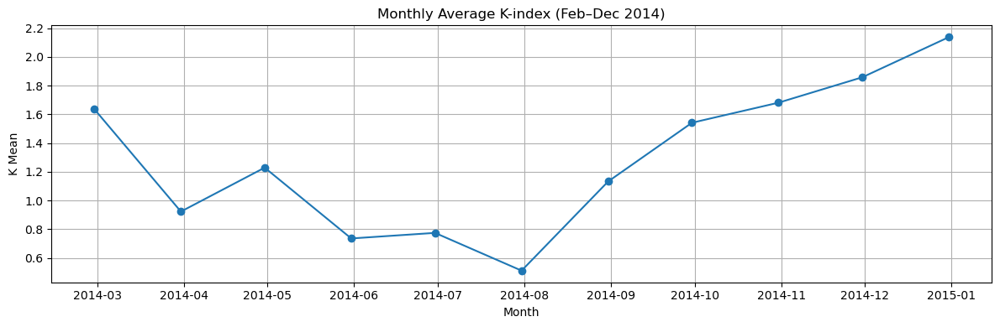

C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\3390175297.py:29: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_storms = k_df["storm_day"].resample("M").sum()


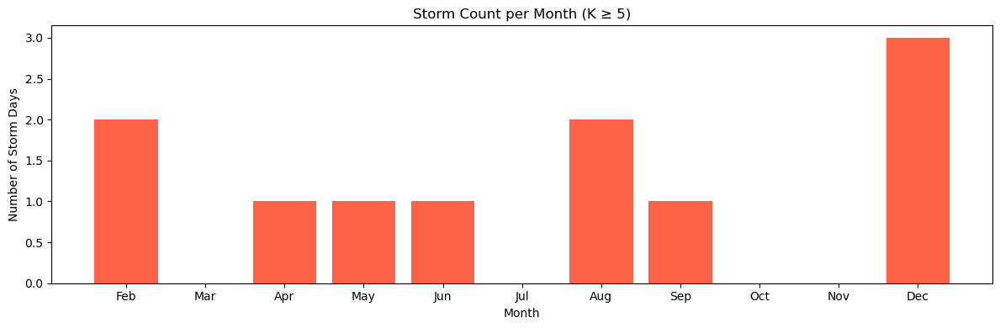

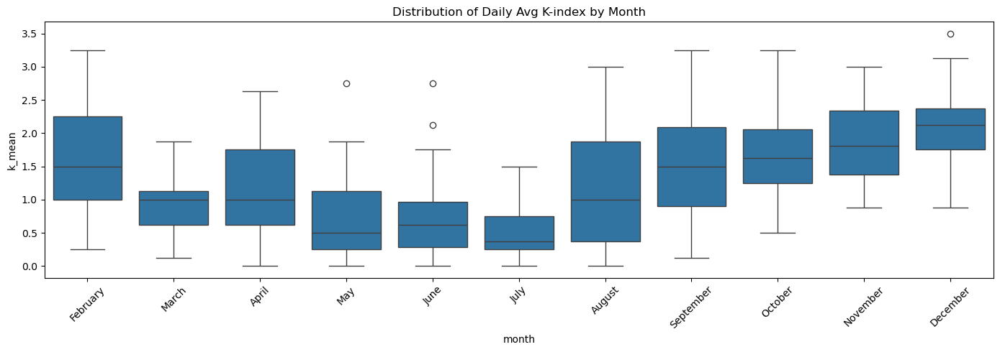

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute helper columns for K-index EDA
k_columns = ["1", "2", "3", "4", "5", "6", "7", "8"]

# Daily average K
k_df["k_mean"] = k_df[k_columns].mean(axis=1)

# Storm indicator: any K ≥ 5 during the day
k_df["storm_day"] = k_df[k_columns].apply(lambda row: any(val >= 5 for val in row), axis=1)

# Month name for grouping
k_df["month"] = k_df.index.strftime("%B")

# PLOT 1: Monthly average K-index
monthly_avg = k_df["k_mean"].resample("M").mean()

plt.figure(figsize=(12, 4))
plt.plot(monthly_avg.index, monthly_avg.values, marker='o')
plt.title("Monthly Average K-index (Feb–Dec 2014)")
plt.ylabel("K Mean")
plt.xlabel("Month")
plt.grid(True)
plt.tight_layout()
plt.show()

# PLOT 2: Storm frequency per month (K ≥ 5)
monthly_storms = k_df["storm_day"].resample("M").sum()

plt.figure(figsize=(12, 4))
plt.bar(monthly_storms.index.strftime("%b"), monthly_storms.values, color='tomato')
plt.title("Storm Count per Month (K ≥ 5)")
plt.ylabel("Number of Storm Days")
plt.xlabel("Month")
plt.tight_layout()
plt.show()

# PLOT 3: Boxplot of daily K mean by month
plt.figure(figsize=(14, 5))
sns.boxplot(x="month", y="k_mean", data=k_df, 
            order=pd.date_range("2024-02-01", "2024-12-01", freq='MS').strftime('%B'))
plt.title("Distribution of Daily Avg K-index by Month")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


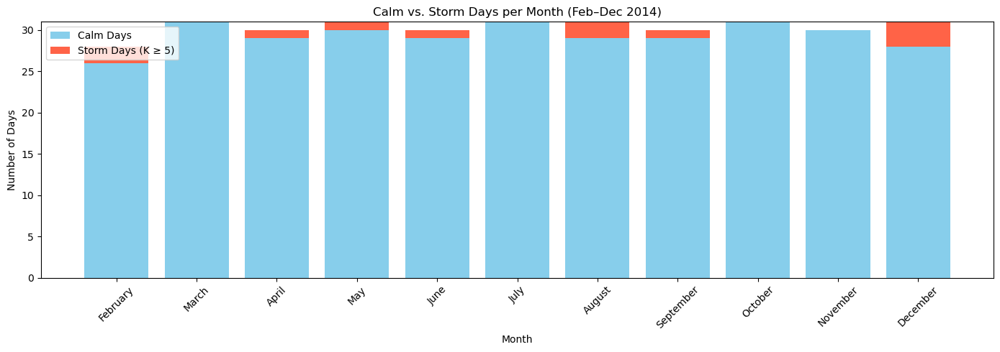

In [25]:
# Count storm and calm days by month
storm_counts = k_df.groupby(k_df.index.month_name())["storm_day"].sum()
total_counts = k_df.groupby(k_df.index.month_name())["storm_day"].count()
calm_counts = total_counts - storm_counts

# Order months correctly
month_order = pd.date_range("2024-02-01", "2024-12-01", freq="MS").strftime("%B").tolist()
storm_counts = storm_counts.reindex(month_order)
calm_counts = calm_counts.reindex(month_order)

# Stacked bar chart (Calm vs Storm)
plt.figure(figsize=(14, 5))
plt.bar(month_order, calm_counts, label="Calm Days", color="skyblue")
plt.bar(month_order, storm_counts, bottom=calm_counts, label="Storm Days (K ≥ 5)", color="tomato")
plt.title("Calm vs. Storm Days per Month (Feb–Dec 2014)")
plt.xlabel("Month")
plt.ylabel("Number of Days")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


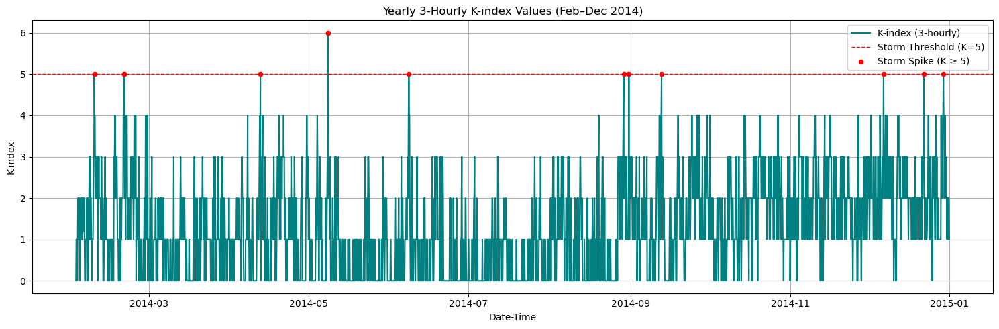

In [26]:
# Sort by datetime to fix line jumps
k_long = k_long.sort_values("datetime")

# Plot
plt.figure(figsize=(15, 5))
plt.plot(k_long["datetime"], k_long["k_value"], color="teal", linewidth=1.5, label="K-index (3-hourly)")

# Storm threshold line
plt.axhline(5, color="red", linestyle="--", linewidth=1, label="Storm Threshold (K=5)")

# Highlight storm spikes (K ≥ 5)
spikes = k_long[k_long["k_value"] >= 5]
plt.scatter(spikes["datetime"], spikes["k_value"],
            color='red', s=20, label="Storm Spike (K ≥ 5)", zorder=5)

# Formatting
plt.title("Yearly 3-Hourly K-index Values (Feb–Dec 2014)")
plt.xlabel("Date-Time")
plt.ylabel("K-index")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

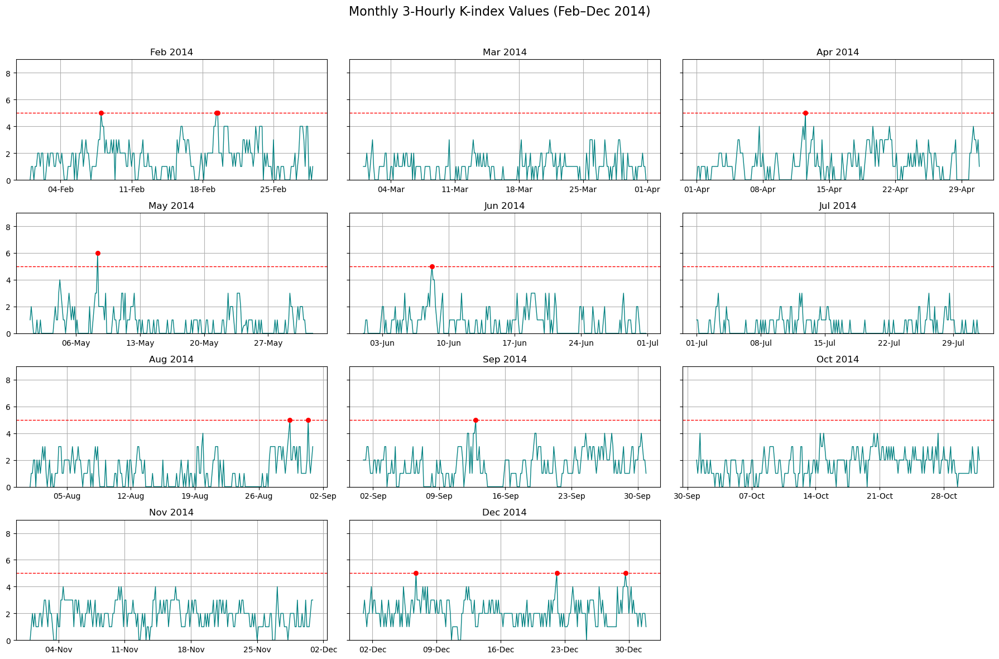

In [27]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Making sure K_value is float
k_long["K_value"] = k_long["k_value"].astype(float)

# Defining months (Feb–Dec)
months = list(range(2, 13))  # 2 to 12
month_names = ["Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# Creating 4x3 grid
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 12), sharey=True)
axes = axes.flatten()

for i, month in enumerate(months):
    month_df = k_long[k_long["datetime"].dt.month == month].sort_values("datetime")

    ax = axes[i]
    ax.plot(month_df["datetime"], month_df["K_value"], color='teal', linewidth=1)

    # Add storm spike markers (K ≥ 5)
    storm_points = month_df[month_df["K_value"] >= 5]
    ax.scatter(storm_points["datetime"], storm_points["K_value"],
               color='red', s=30, label='K ≥ 5', zorder=5)

    ax.axhline(5, color='red', linestyle='--', linewidth=1)
    ax.set_title(f"{month_names[i]} 2014")
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0, 9)
    ax.grid(True)

# Hide unused subplot if needed
if len(months) < len(axes):
    fig.delaxes(axes[-1])

# Final formatting
fig.suptitle("Monthly 3-Hourly K-index Values (Feb–Dec 2014)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


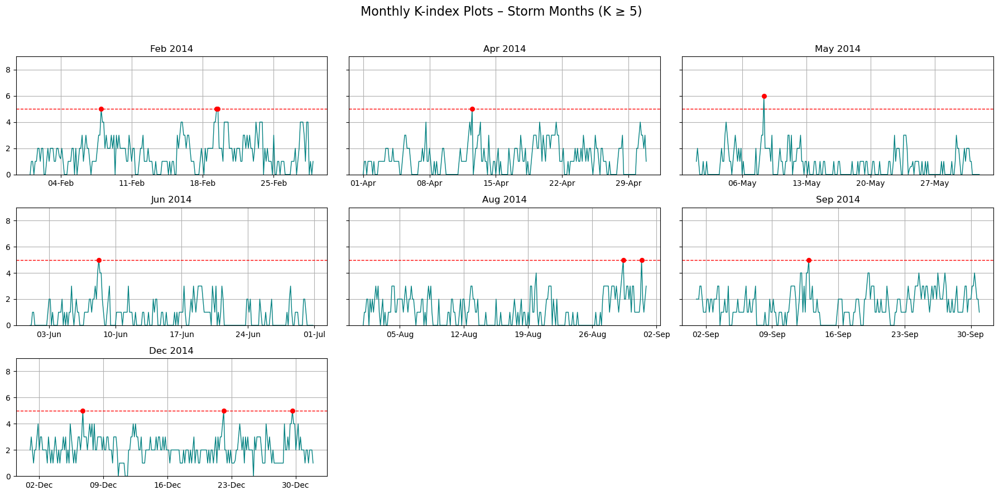

In [28]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Ensure K_value is float
k_long["K_value"] = k_long["k_value"].astype(float)

# Identify storm months (K ≥ 5 occurred)
storm_months = k_long[k_long["K_value"] >= 5]["datetime"].dt.month.unique()
storm_months.sort()
month_names = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# Setup grid
n = len(storm_months)
ncols = 3
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, nrows * 3), sharey=True)
axes = axes.flatten()

for i, month in enumerate(storm_months):
    # Sort by datetime to avoid line glitches
    month_df = k_long[k_long["datetime"].dt.month == month].sort_values("datetime")
    
    ax = axes[i]
    ax.plot(month_df["datetime"], month_df["K_value"], color='teal', linewidth=1, label="K-index")
    ax.axhline(5, color='red', linestyle='--', linewidth=1)

    # Highlight storm points (K ≥ 5)
    storm_points = month_df[month_df["K_value"] >= 5]
    ax.scatter(storm_points["datetime"], storm_points["K_value"],
               color='red', s=30, label='Storm Spike (K ≥ 5)', zorder=5)

    ax.set_title(f"{month_names[month - 1]} 2014")
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0, 9)
    ax.grid(True)

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Final formatting
fig.suptitle(" Monthly K-index Plots – Storm Months (K ≥ 5)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


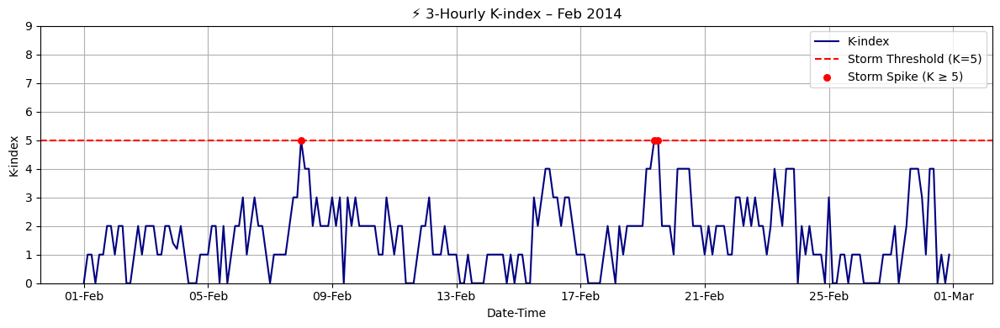

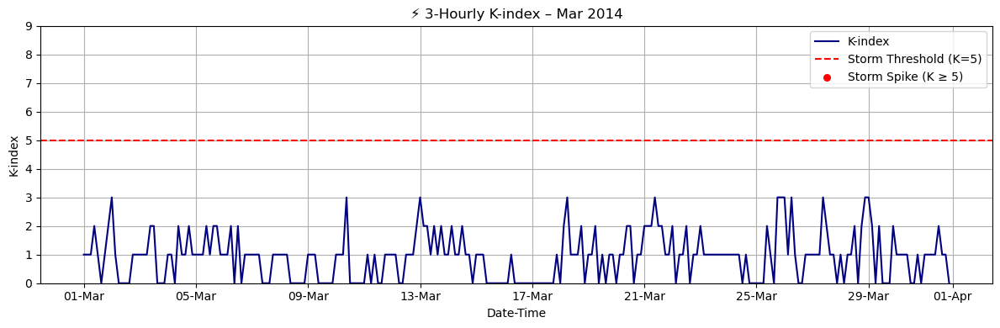

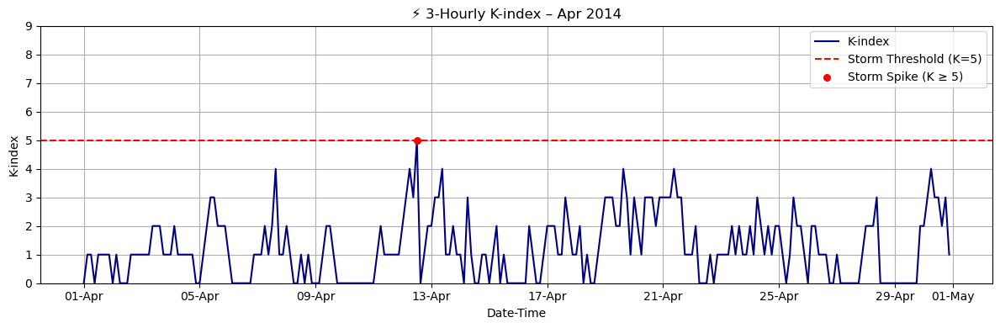

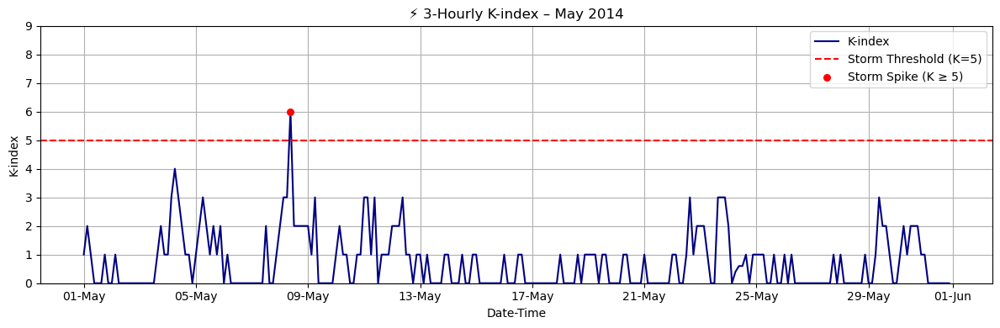

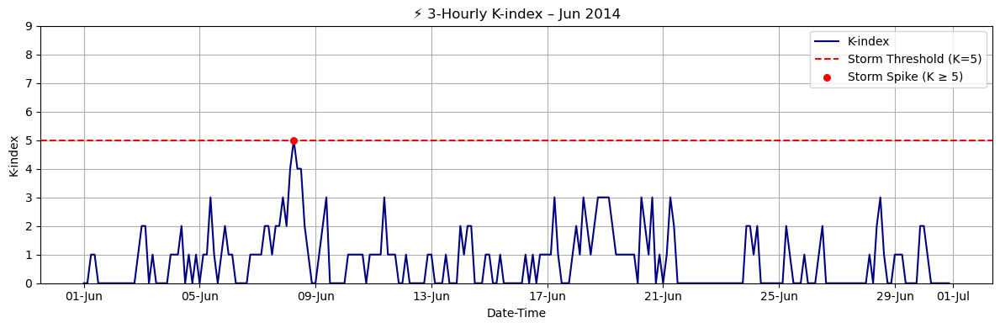

...

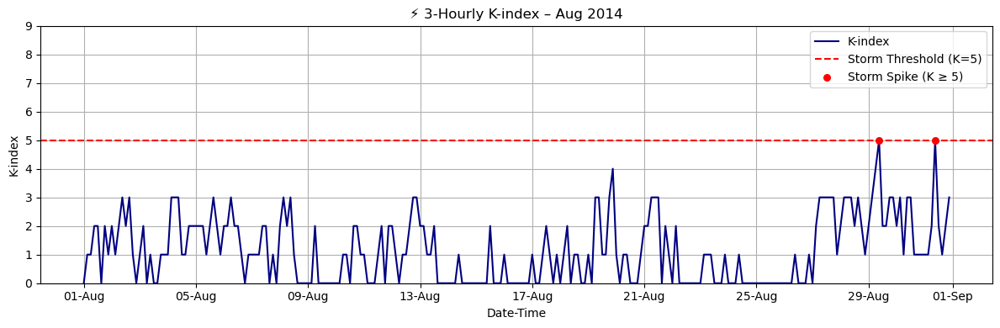

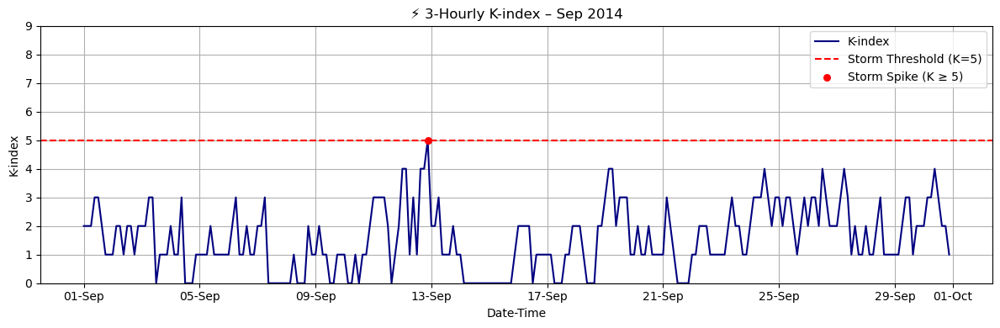

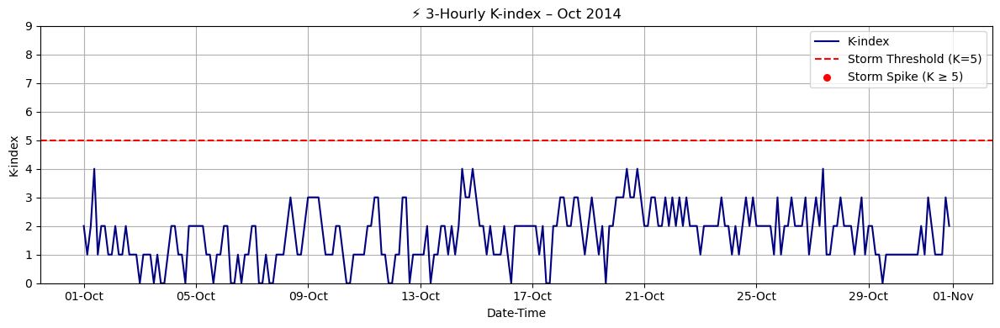

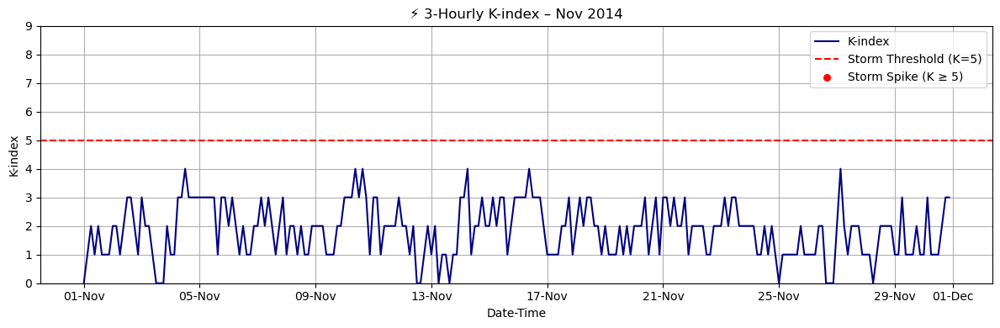

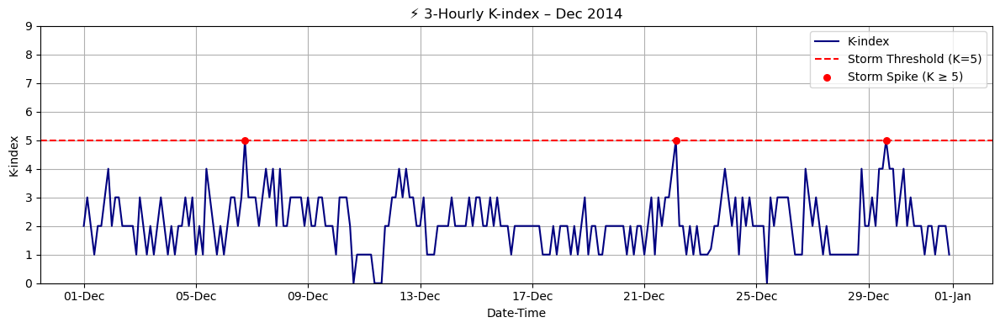

In [29]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Define months (Feb–Dec)
months = list(range(2, 13))
month_names = ["Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# Loop through each month
for i, month in enumerate(months):
    # Filter and sort the 3-hourly data for one month
    month_df = k_long[k_long["datetime"].dt.month == month].sort_values("datetime")

    plt.figure(figsize=(12, 4))
    plt.plot(month_df["datetime"], month_df["k_value"], color='navy', linewidth=1.5, label="K-index")
    plt.axhline(5, color='red', linestyle='--', label="Storm Threshold (K=5)")

    # ✅ Add storm spike points
    spikes = month_df[month_df["k_value"] >= 5]
    plt.scatter(spikes["datetime"], spikes["k_value"], color='red', s=30, label="Storm Spike (K ≥ 5)", zorder=5)

    # Formatting
    plt.title(f"⚡ 3-Hourly K-index – {month_names[i]} 2014")
    plt.xlabel("Date-Time")
    plt.ylabel("K-index")
    plt.ylim(0, 9)
    plt.grid(True)
    plt.legend()
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.tight_layout()
    plt.show()


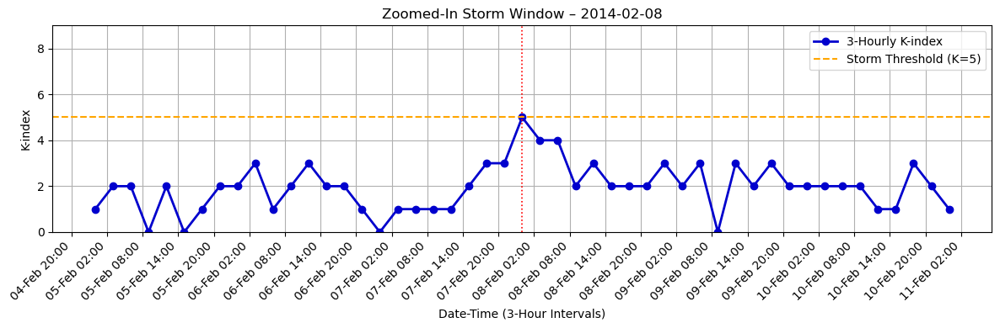

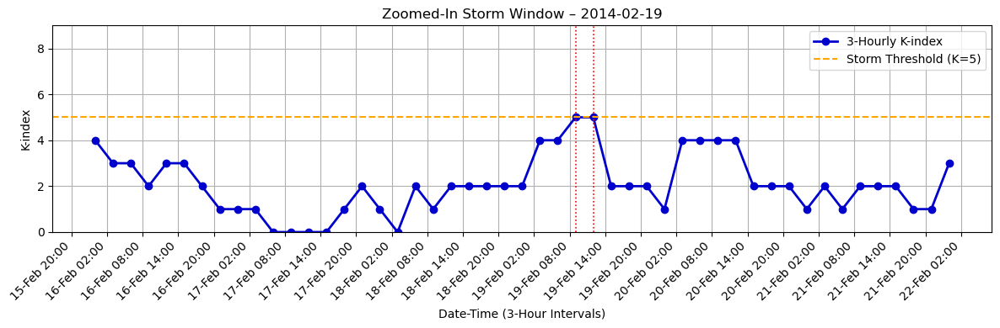

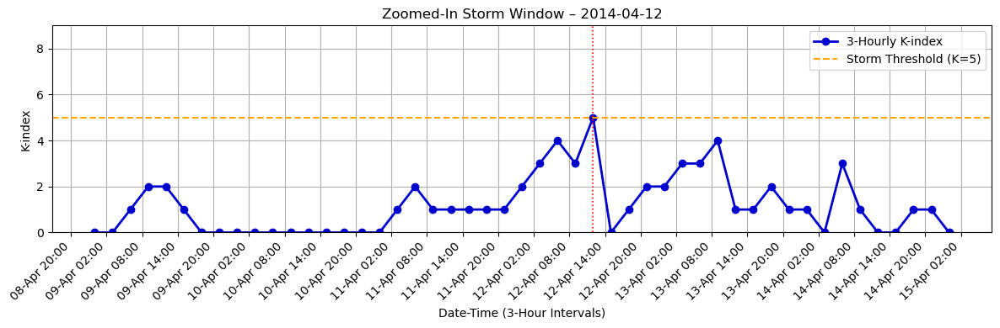

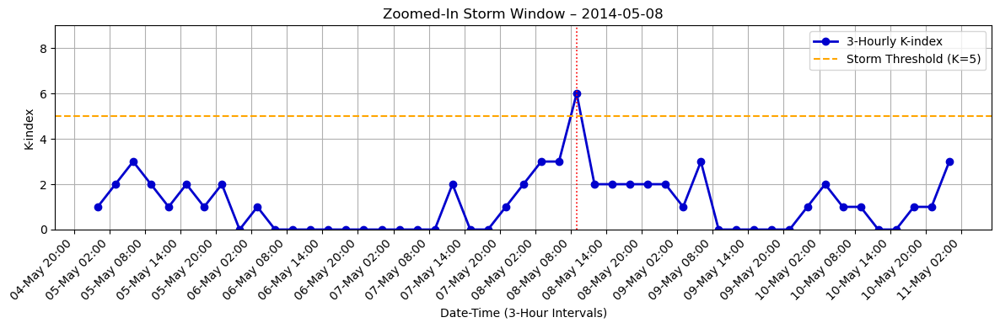

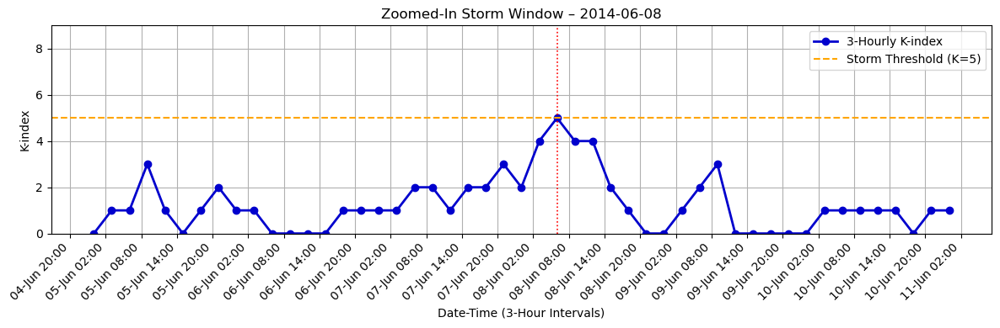

...

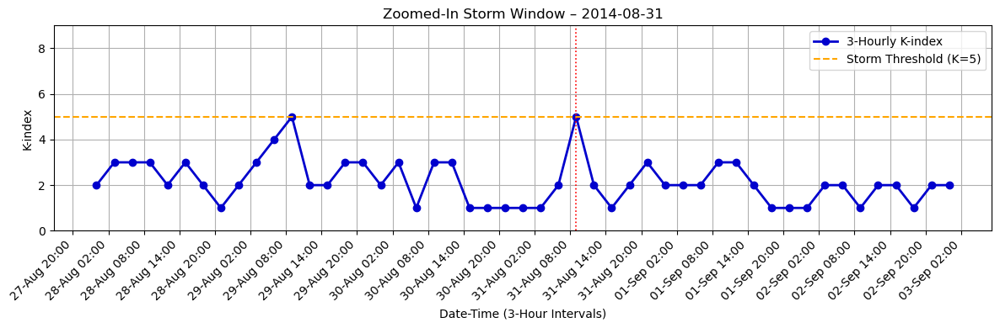

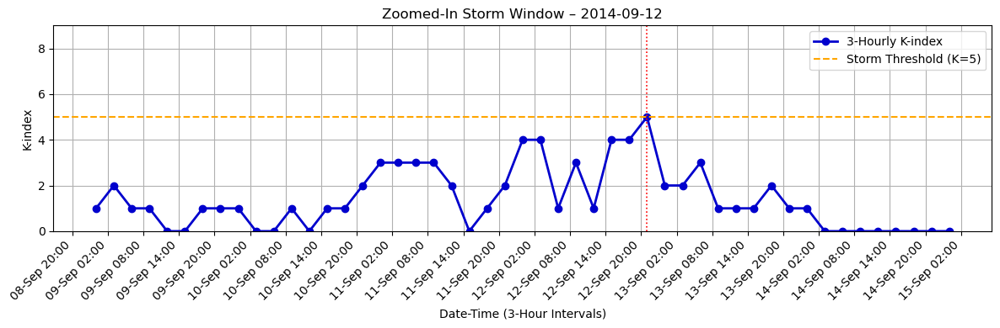

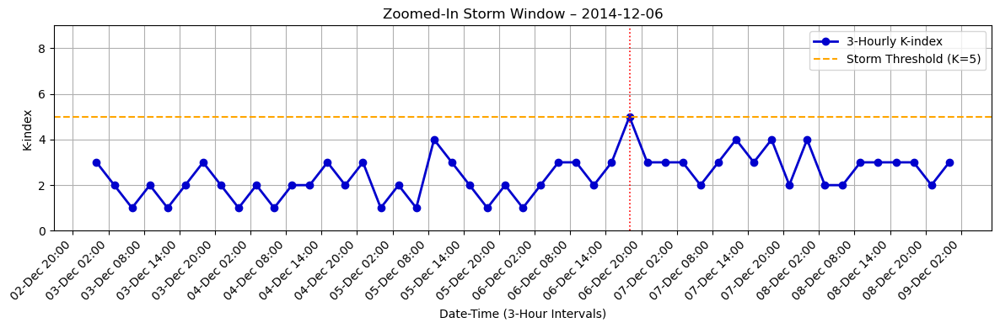

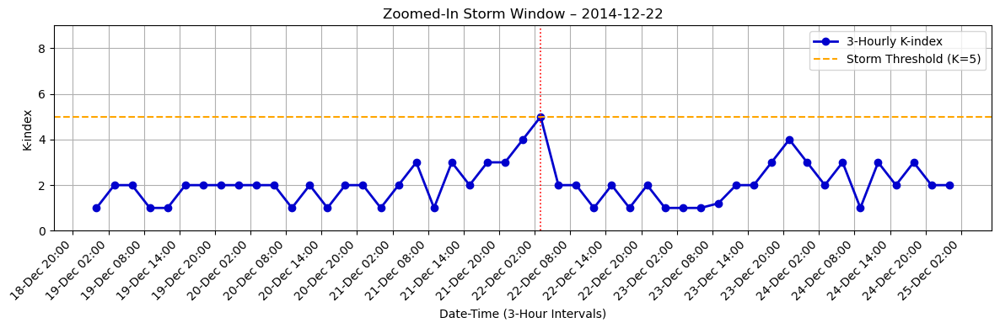

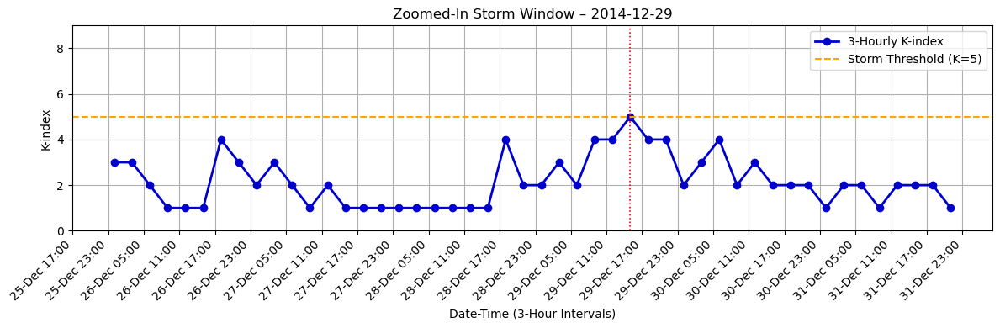

In [30]:
from datetime import timedelta
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Identify storm days
storm_days = k_df[k_df["storm_day"] == True].index

# Loop through each storm and zoom in
for storm_date in storm_days:
    # Define 7-day window: 3 before and 3 after
    start = storm_date - timedelta(days=3)
    end = storm_date + timedelta(days=3)

    # Filter 3-hour K-index for this window
    storm_window = k_long[(k_long["datetime"] >= start) & (k_long["datetime"] <= end)].copy()
    storm_window = storm_window.sort_values("datetime")

    # Plot
    plt.figure(figsize=(12, 4))
    plt.plot(storm_window["datetime"], storm_window["K_value"],
             color='mediumblue', marker='o', linewidth=2, label='3-Hourly K-index')

    # Highlight storm blocks with vertical lines
    storm_blocks = storm_window[(storm_window["date"] == storm_date) & (storm_window["K_value"] >= 5)]
    for t in storm_blocks["datetime"]:
        plt.axvline(t, color='red', linestyle=':', linewidth=1.2)

    # Storm threshold
    plt.axhline(5, color='orange', linestyle='--', label='Storm Threshold (K=5)')

    # Fix: Show time labels every 6 hours
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=6))  # every 6 hours
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b %H:%M'))
    plt.xticks(rotation=45, ha='right')

    # Labels and layout
    plt.title(f"Zoomed-In Storm Window – {storm_date.strftime('%Y-%m-%d')}")
    plt.xlabel("Date-Time (3-Hour Intervals)")
    plt.ylabel("K-index")
    plt.ylim(0, 9)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


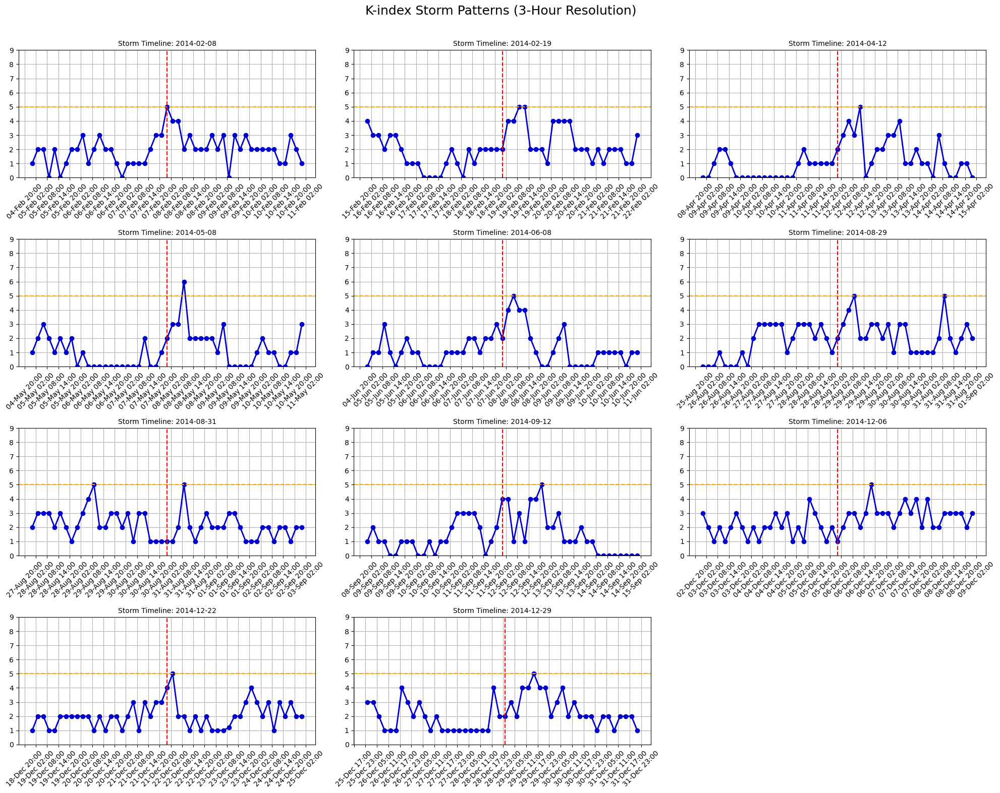

In [31]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import timedelta

# Identify storm days
storm_days = k_df[k_df["storm_day"] == True].index

# Plot all storms in a grid with larger size
n_storms = len(storm_days)
ncols = 3  # Set columns
nrows = (n_storms + ncols - 1) // ncols  # Ceiling division

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 4 * nrows))
axes = axes.flatten()

for i, storm_date in enumerate(storm_days):
    start = storm_date - timedelta(days=3)
    end = storm_date + timedelta(days=3)
    storm_window = k_long[(k_long["datetime"] >= start) & (k_long["datetime"] <= end)].copy()
    storm_window = storm_window.sort_values("datetime")

    ax = axes[i]
    ax.plot(storm_window["datetime"], storm_window["K_value"],
            color='mediumblue', marker='o', linewidth=2, label='3-Hourly K-index')
    ax.axhline(5, color='orange', linestyle='--', label='Storm Threshold (K≥5)')
    ax.axvline(storm_date, color='red', linestyle='--', linewidth=1.5, label='Storm Day')

    ax.set_title(f"Storm Timeline: {storm_date.strftime('%Y-%m-%d')}", fontsize=10)
    ax.set_ylim(0, 9)
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=6))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b %H:%M'))
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)

# Turn off extra subplots
for j in range(i+1, len(axes)):
    axes[j].axis("off")

fig.suptitle("K-index Storm Patterns (3-Hour Resolution)", fontsize=18)
fig.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


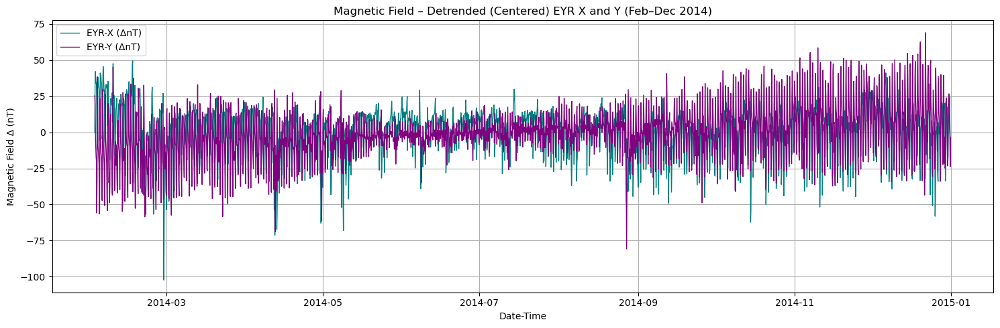

In [32]:
# Center the data by removing long-term mean
eyrx_centered = mag_df_3h["eyrx"] - mag_df_3h["eyrx"].mean()
eyry_centered = mag_df_3h["eyry"] - mag_df_3h["eyry"].mean()

plt.figure(figsize=(15, 5))
plt.plot(mag_df_3h["datetime"], eyrx_centered, label="EYR-X (ΔnT)", color="teal", linewidth=1)
plt.plot(mag_df_3h["datetime"], eyry_centered, label="EYR-Y (ΔnT)", color="purple", linewidth=1)

plt.title("Magnetic Field – Detrended (Centered) EYR X and Y (Feb–Dec 2014)")
plt.xlabel("Date-Time")
plt.ylabel("Magnetic Field Δ (nT)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


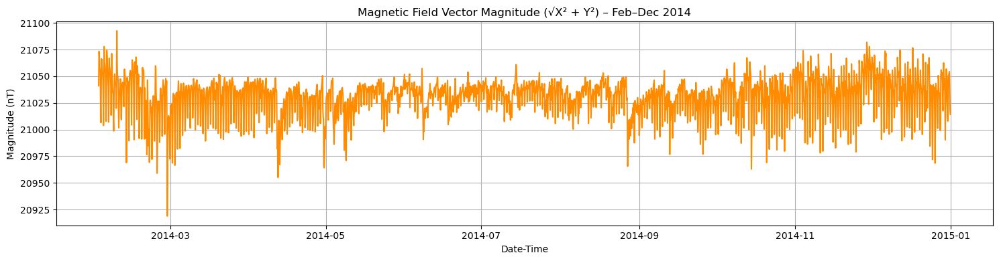

In [33]:
mag_df_3h["mag_magnitude"] = (mag_df_3h["eyrx"]**2 + mag_df_3h["eyry"]**2)**0.5

plt.figure(figsize=(15, 4))
plt.plot(mag_df_3h["datetime"], mag_df_3h["mag_magnitude"], color="darkorange", linewidth=1.5)
plt.title("Magnetic Field Vector Magnitude (√X² + Y²) – Feb–Dec 2014")
plt.xlabel("Date-Time")
plt.ylabel("Magnitude (nT)")
plt.grid(True)
plt.tight_layout()
plt.show()


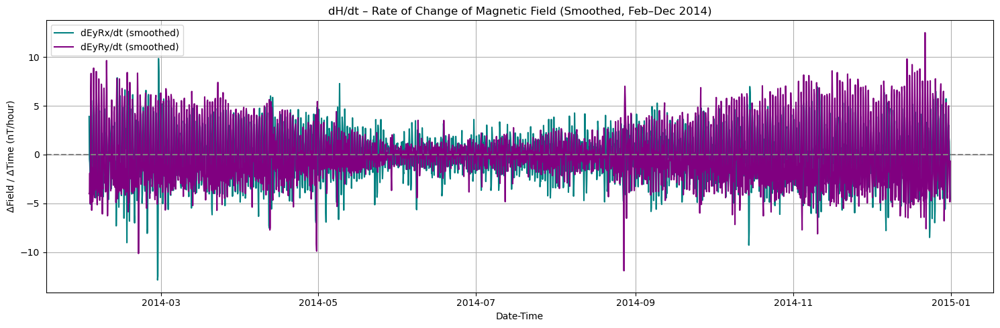

In [34]:
# STEP 1: Compute dH/dt using .diff() for both X and Y
mag_df_3h["dEyRx_dt"] = mag_df_3h["eyrx"].diff() / 3  # nT per hour
mag_df_3h["dEyRy_dt"] = mag_df_3h["eyry"].diff() / 3

# smoothing (e.g. 3-sample rolling mean = 9 hours total)
mag_df_3h["dEyRx_dt_smoothed"] = mag_df_3h["dEyRx_dt"].rolling(window=3, center=True).mean()
mag_df_3h["dEyRy_dt_smoothed"] = mag_df_3h["dEyRy_dt"].rolling(window=3, center=True).mean()

# STEP 2: Plot smoothed dH/dt
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
plt.plot(mag_df_3h["datetime"], mag_df_3h["dEyRx_dt_smoothed"], label="dEyRx/dt (smoothed)", color="teal")
plt.plot(mag_df_3h["datetime"], mag_df_3h["dEyRy_dt_smoothed"], label="dEyRy/dt (smoothed)", color="purple")
plt.axhline(0, color='gray', linestyle='--')
plt.title("dH/dt – Rate of Change of Magnetic Field (Smoothed, Feb–Dec 2014)")
plt.xlabel("Date-Time")
plt.ylabel("ΔField / ΔTime (nT/hour)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


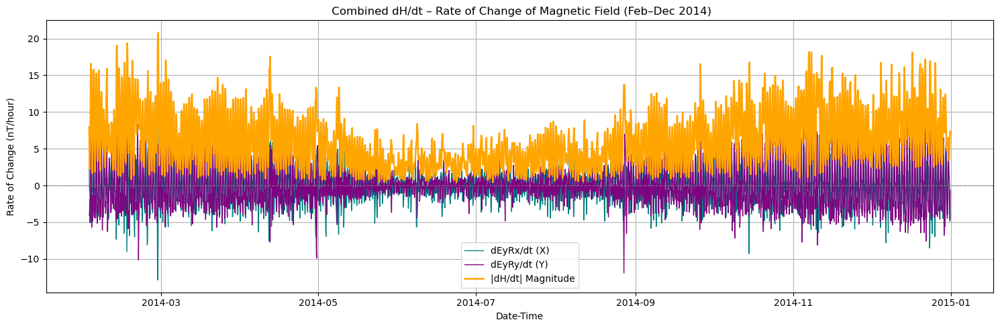

In [35]:
# STEP 1: Compute vector magnitude of dH/dt
mag_df_3h["dMag_dt"] = (mag_df_3h["dEyRx_dt"]**2 + mag_df_3h["dEyRy_dt"]**2)**0.5
mag_df_3h["dMag_dt_smoothed"] = mag_df_3h["dMag_dt"].rolling(window=3, center=True).mean()

# STEP 2: Plot all on the same Y-axis
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
plt.plot(mag_df_3h["datetime"], mag_df_3h["dEyRx_dt_smoothed"], label="dEyRx/dt (X)", color="teal", linewidth=1)
plt.plot(mag_df_3h["datetime"], mag_df_3h["dEyRy_dt_smoothed"], label="dEyRy/dt (Y)", color="purple", linewidth=1)
plt.plot(mag_df_3h["datetime"], mag_df_3h["dMag_dt_smoothed"], label="|dH/dt| Magnitude", color="orange", linewidth=1.8)

plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)

plt.title(" Combined dH/dt – Rate of Change of Magnetic Field (Feb–Dec 2014)")
plt.xlabel("Date-Time")
plt.ylabel("Rate of Change (nT/hour)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


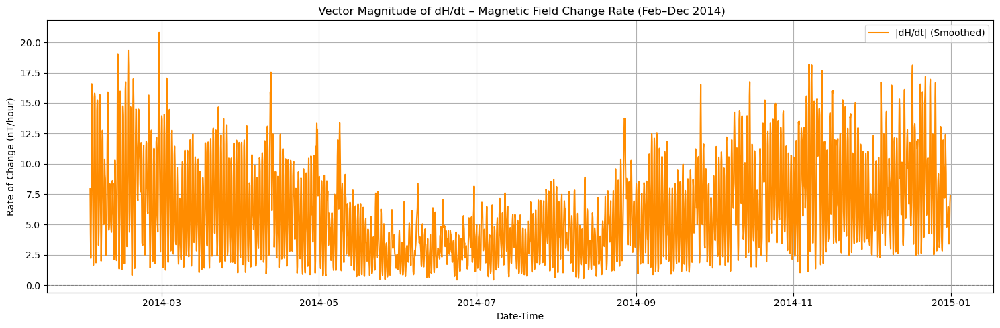

In [36]:
# STEP 1: Compute dX/dt and dY/dt from 3-hour magnetic field data
mag_df_3h["dEyRx_dt"] = mag_df_3h["eyrx"].diff() / 3  # (nT/hour)
mag_df_3h["dEyRy_dt"] = mag_df_3h["eyry"].diff() / 3

# STEP 2: Combine both axes using vector magnitude
mag_df_3h["dHdt_magnitude"] = (mag_df_3h["dEyRx_dt"]**2 + mag_df_3h["dEyRy_dt"]**2) ** 0.5

# Apply smoothing (e.g. 3-point rolling mean)
mag_df_3h["dHdt_smooth"] = mag_df_3h["dHdt_magnitude"].rolling(window=3, center=True).mean()

# STEP 3: Plot the final result
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
plt.plot(mag_df_3h["datetime"], mag_df_3h["dHdt_smooth"], color='darkorange', linewidth=1.5, label='|dH/dt| (Smoothed)')

plt.title(" Vector Magnitude of dH/dt – Magnetic Field Change Rate (Feb–Dec 2014)")
plt.xlabel("Date-Time")
plt.ylabel("Rate of Change (nT/hour)")
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


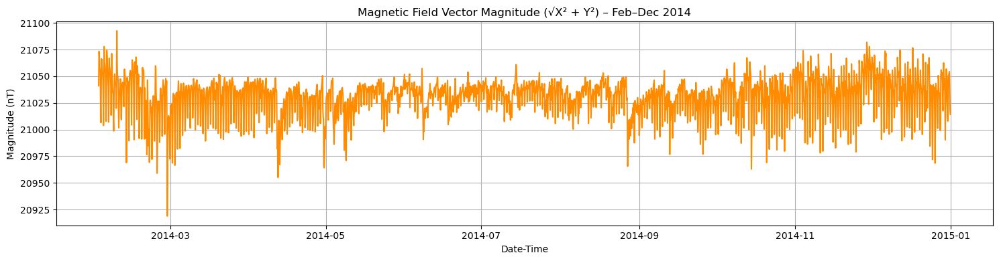

In [37]:
# STEP: Compute magnitude of magnetic field vector (no derivative)
mag_df_3h["mag_magnitude"] = (mag_df_3h["eyrx"]**2 + mag_df_3h["eyry"]**2) ** 0.5

# STEP: Plot the magnitude over the year
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 4))
plt.plot(mag_df_3h["datetime"], mag_df_3h["mag_magnitude"], color="darkorange", linewidth=1.5)

plt.title("Magnetic Field Vector Magnitude (√X² + Y²) – Feb–Dec 2014")
plt.xlabel("Date-Time")
plt.ylabel("Magnitude (nT)")
plt.grid(True)
plt.tight_layout()
plt.show()

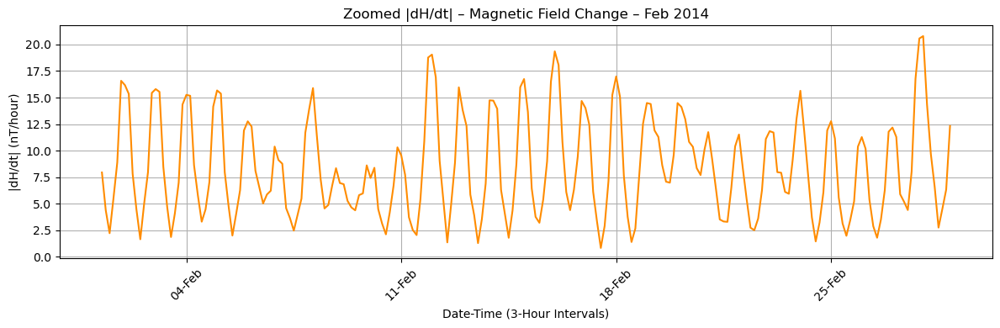

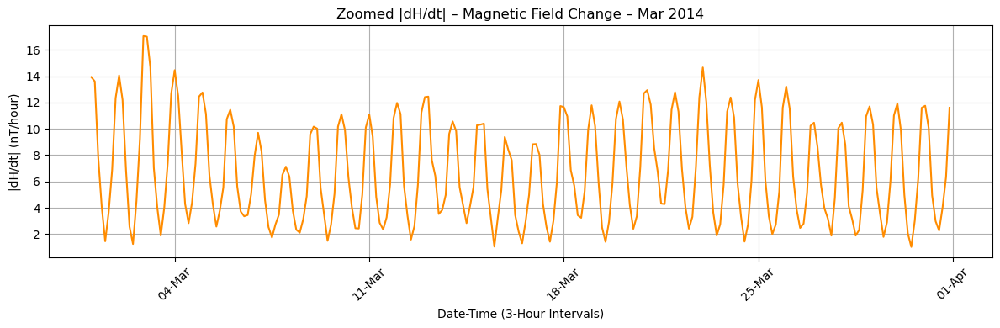

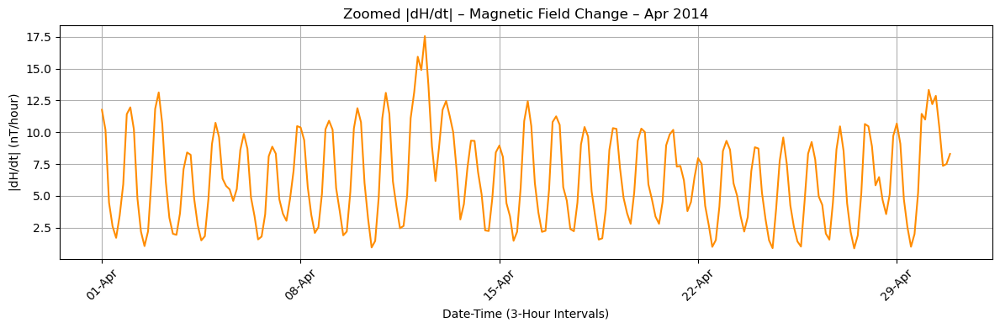

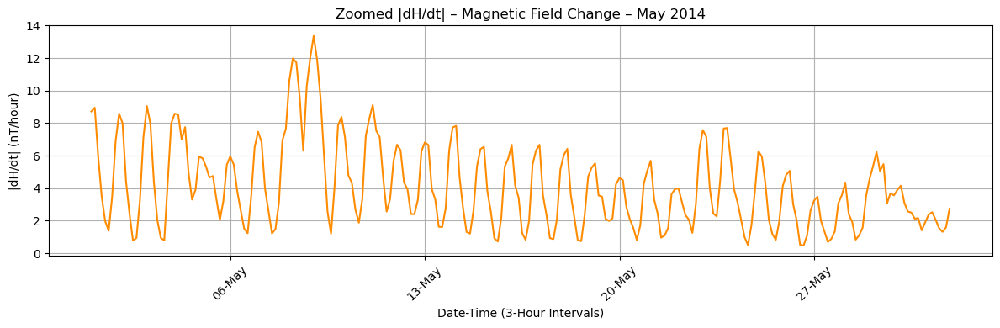

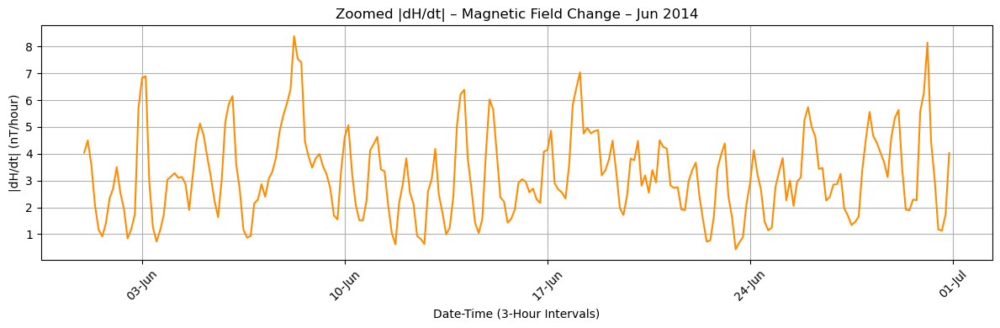

...

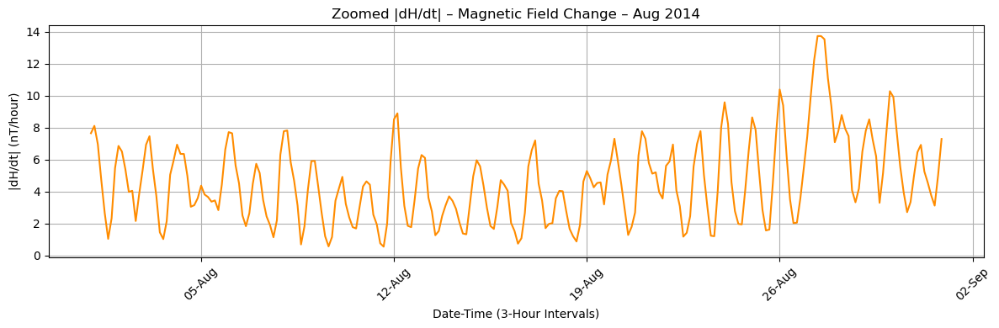

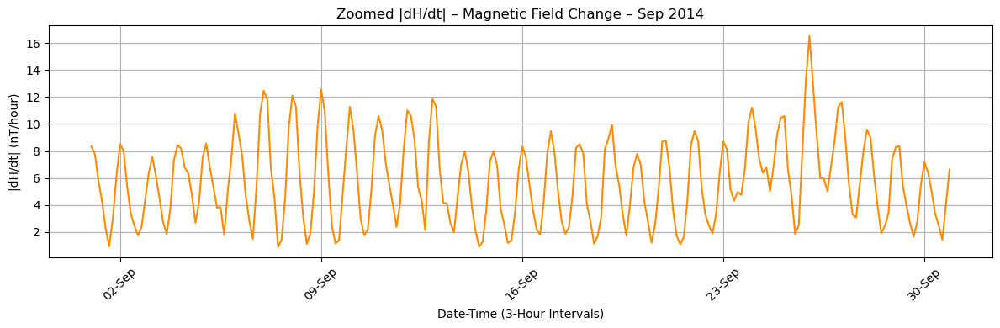

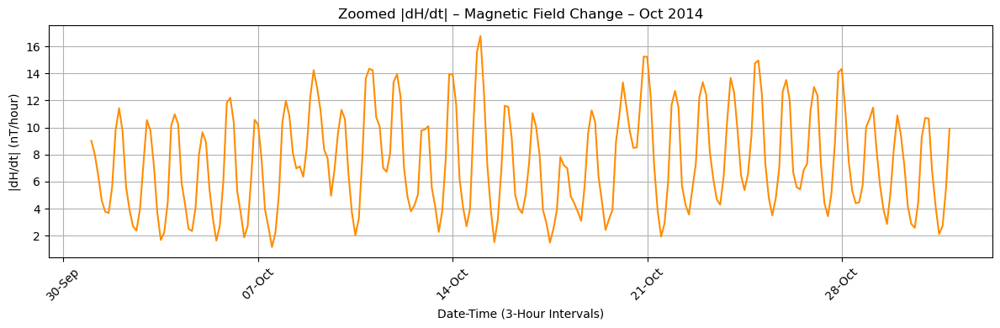

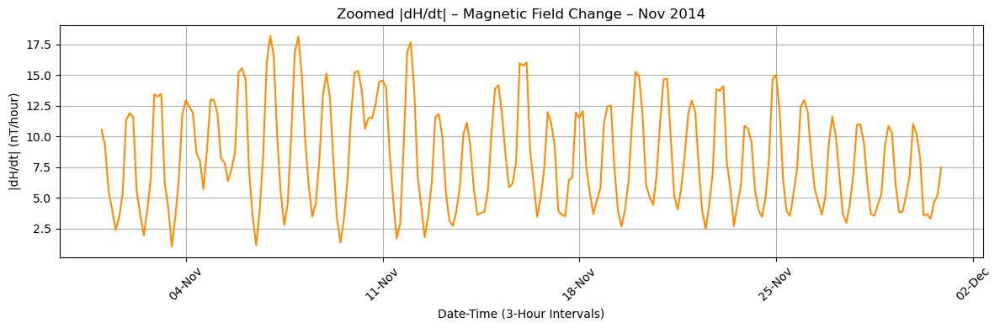

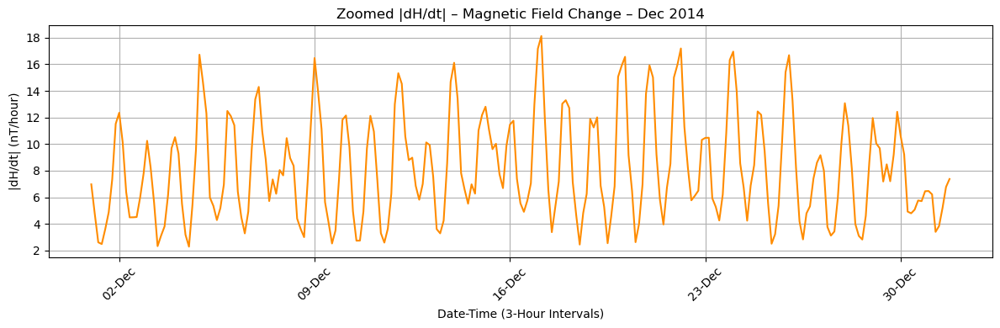

In [38]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Months and labels
months = list(range(2, 13))
month_names = ["Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

for i, month in enumerate(months):
    month_df = mag_df_3h[mag_df_3h["datetime"].dt.month == month]

    plt.figure(figsize=(12, 4))
    plt.plot(month_df["datetime"], month_df["dHdt_smooth"], color='darkorange', linewidth=1.5)
    plt.title(f"Zoomed |dH/dt| – Magnetic Field Change – {month_names[i]} 2014")
    plt.xlabel("Date-Time (3-Hour Intervals)")
    plt.ylabel("|dH/dt| (nT/hour)")
    plt.grid(True)

    # Format time labels
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()


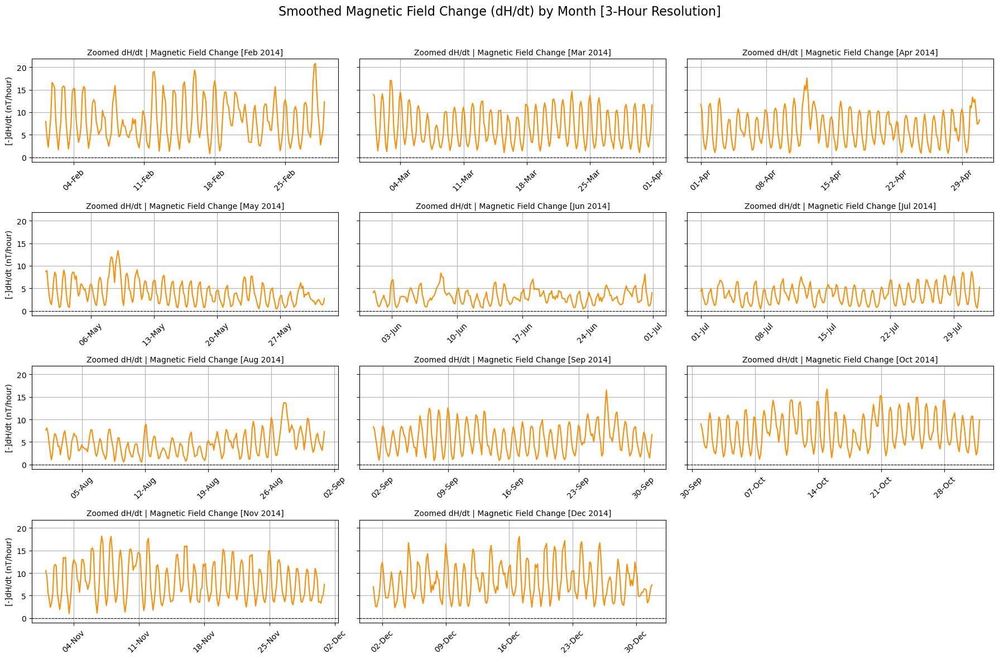

In [39]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Months and labels
months = list(range(2, 13))  # Feb to Dec
month_names = ['Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 12), sharey=True)
axes = axes.flatten()

for i, month in enumerate(months):
    ax = axes[i]
    month_df = mag_df_3h[mag_df_3h['datetime'].dt.month == month]
    
    ax.plot(month_df["datetime"], month_df["dHdt_smooth"], color='darkorange', linewidth=1.5)
    ax.axhline(0, color='black', linestyle='--', linewidth=0.8)
    
    ax.set_title(f"Zoomed dH/dt | Magnetic Field Change [{month_names[i]} 2014]", fontsize=10)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)
    if i % 3 == 0:
        ax.set_ylabel("[-]dH/dt (nT/hour)")

# Hide any unused subplots (e.g., last one if not divisible by 3)
for j in range(len(months), len(axes)):
    fig.delaxes(axes[j])

# Overall figure title
fig.suptitle("Smoothed Magnetic Field Change (dH/dt) by Month [3-Hour Resolution]", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



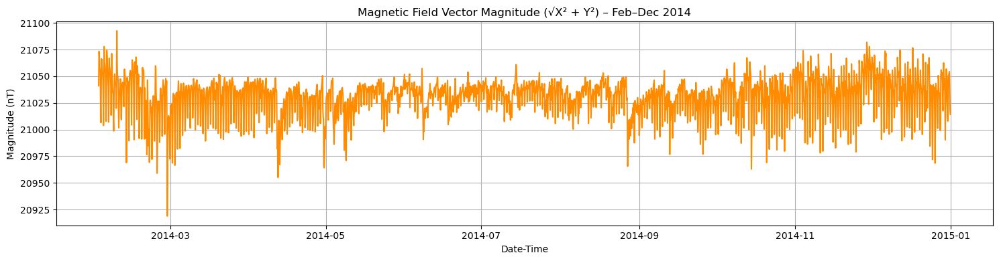

In [40]:
# STEP: Compute magnitude of magnetic field vector (no derivative)
mag_df_3h["mag_magnitude"] = (mag_df_3h["eyrx"]**2 + mag_df_3h["eyry"]**2) ** 0.5

# STEP: Plot the magnitude over the year
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 4))
plt.plot(mag_df_3h["datetime"], mag_df_3h["mag_magnitude"], color="darkorange", linewidth=1.5)

plt.title("Magnetic Field Vector Magnitude (√X² + Y²) – Feb–Dec 2014")
plt.xlabel("Date-Time")
plt.ylabel("Magnitude (nT)")
plt.grid(True)
plt.tight_layout()
plt.show()


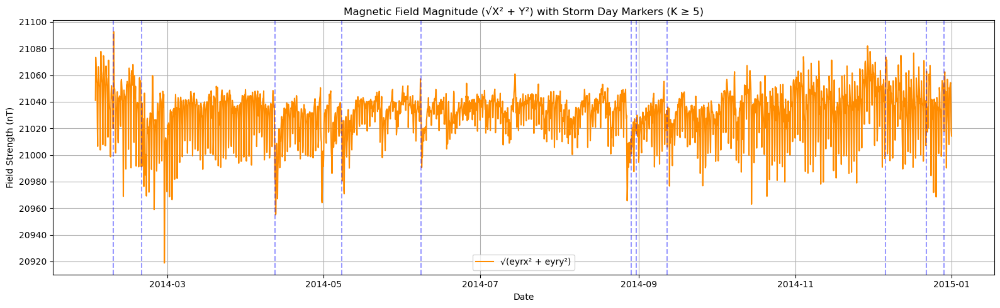

In [41]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator

# Compute Magnetic Field Magnitude 
mag_df_3h["mag_magnitude"] = np.sqrt(mag_df_3h["eyrx"]**2 + mag_df_3h["eyry"]**2)

# Identify Storm Days (K-index ≥ 5 in any 3-hour block) 
storm_dates = k_df[k_df[["1", "2", "3", "4", "5", "6", "7", "8"]].max(axis=1) >= 5].index.normalize().unique()

# 3. Plot 
plt.figure(figsize=(16, 5))
plt.plot(mag_df_3h["datetime"], mag_df_3h["mag_magnitude"], color="darkorange", label="√(eyrx² + eyry²)", linewidth=1.5)

# Overlay vertical lines on storm days
for storm_day in storm_dates:
    plt.axvline(storm_day, color='blue', linestyle='--', alpha=0.4)

# Formatting
plt.title("Magnetic Field Magnitude (√X² + Y²) with Storm Day Markers (K ≥ 5)")
plt.xlabel("Date")
plt.ylabel("Field Strength (nT)")
plt.legend()
plt.grid(True)

# Force whole number Y-axis ticks
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

plt.tight_layout()
plt.show()


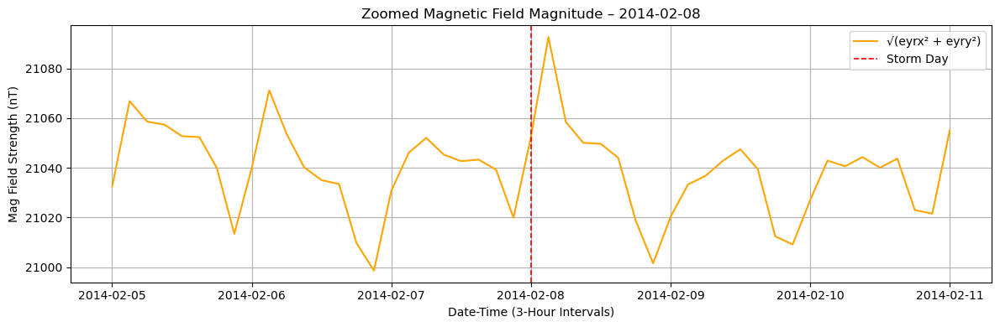

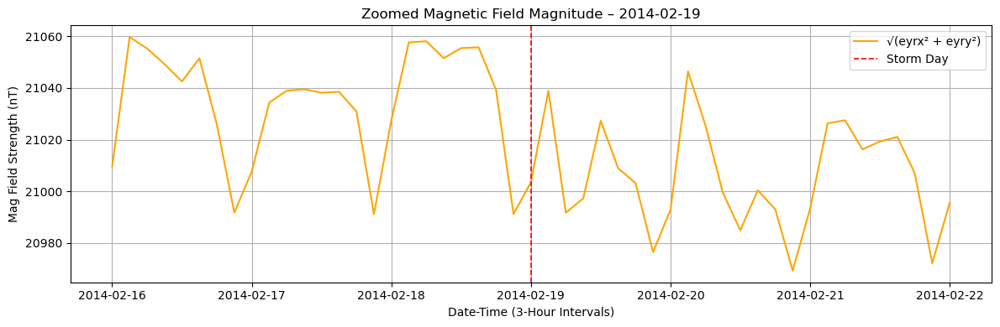

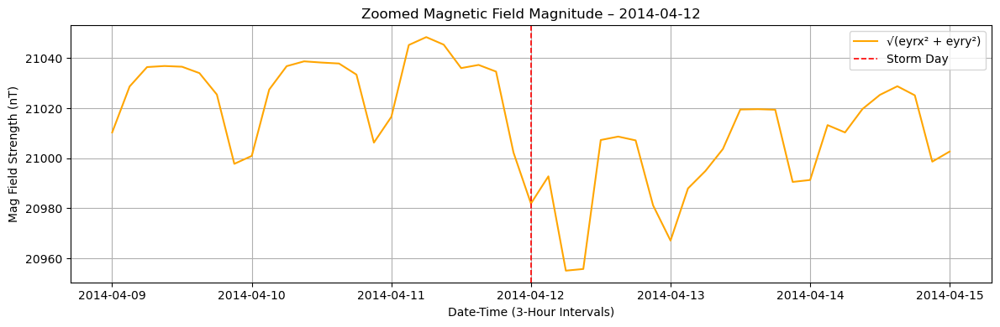

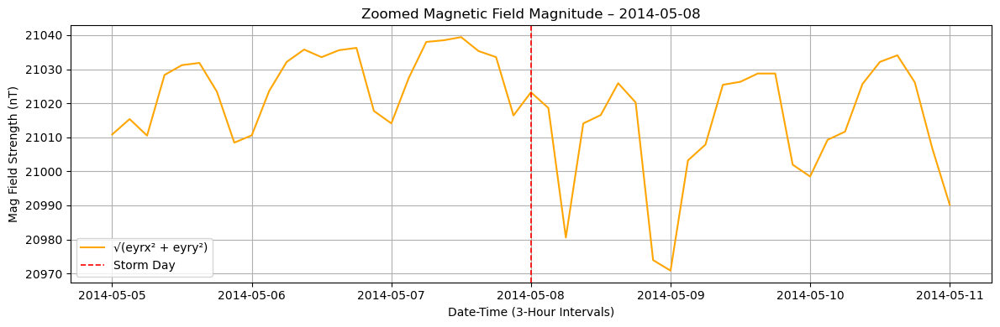

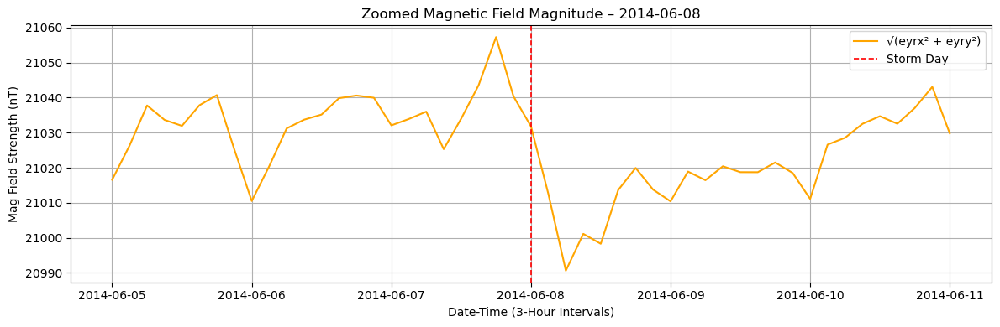

...

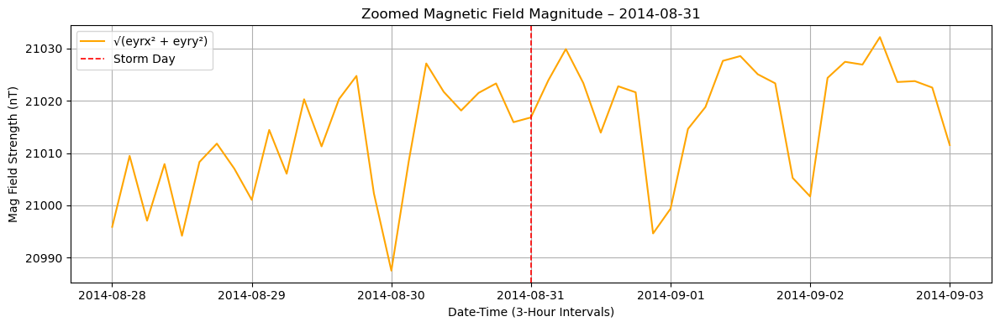

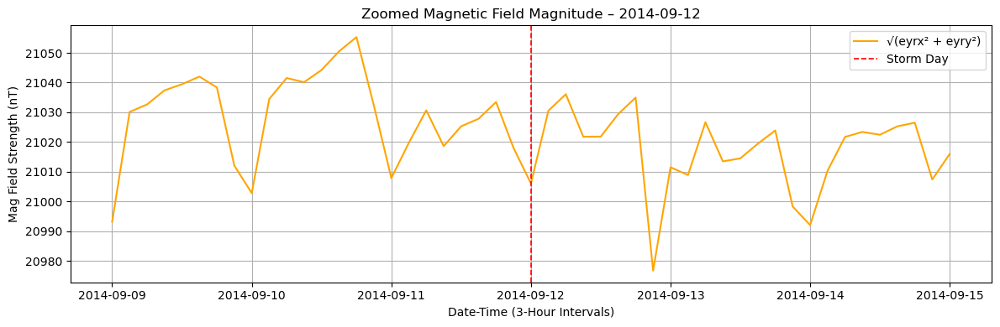

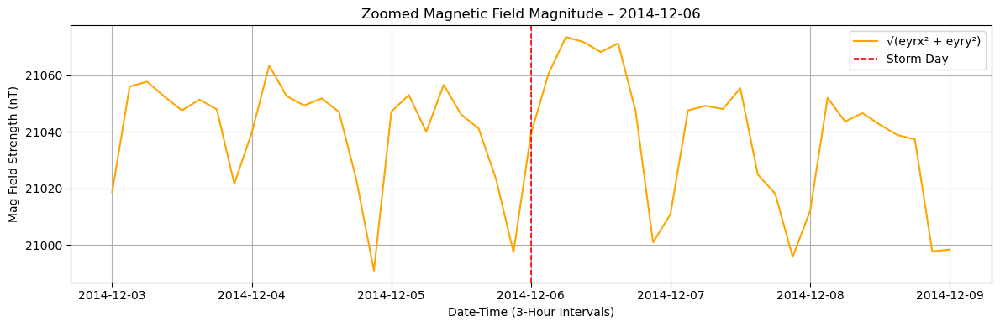

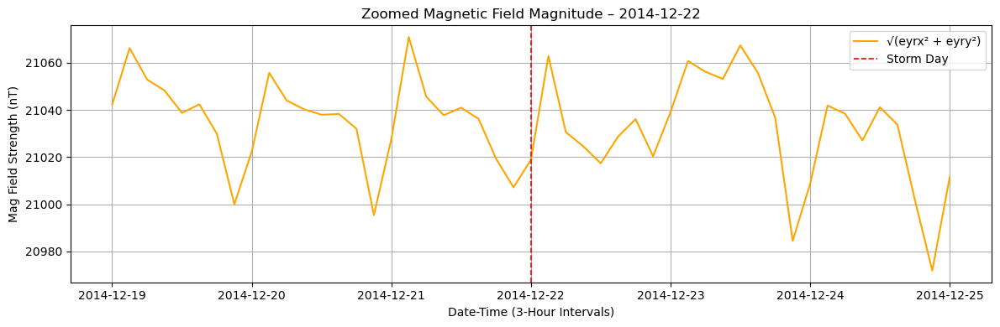

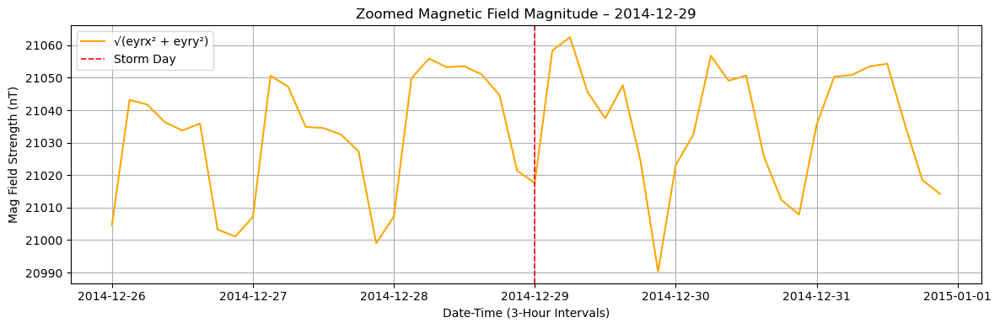

In [42]:
from datetime import timedelta
import matplotlib.pyplot as plt

# STEP 1: Recalculate magnitude if needed
mag_df_3h["mag_magnitude"] = np.sqrt(mag_df_3h["eyrx"]**2 + mag_df_3h["eyry"]**2)

# STEP 2: Use normalized storm days from k_df
storm_days = k_df[k_df[["1","2","3","4","5","6","7","8"]].max(axis=1) >= 5].index.normalize().unique()

# STEP 3: Loop through each storm day and plot
for storm_day in storm_days:
    start = storm_day - timedelta(days=3)
    end = storm_day + timedelta(days=3)
    
    window_df = mag_df_3h[(mag_df_3h["datetime"] >= start) & (mag_df_3h["datetime"] <= end)].copy()

    # Plot
    plt.figure(figsize=(12, 4))
    plt.plot(window_df["datetime"], window_df["mag_magnitude"], color="orange", linewidth=1.5, label="√(eyrx² + eyry²)")
    
    # Mark storm time with vertical line
    plt.axvline(storm_day, color='red', linestyle='--', linewidth=1.2, label='Storm Day')
    
    plt.title(f"Zoomed Magnetic Field Magnitude – {storm_day.strftime('%Y-%m-%d')}")
    plt.xlabel("Date-Time (3-Hour Intervals)")
    plt.ylabel("Mag Field Strength (nT)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


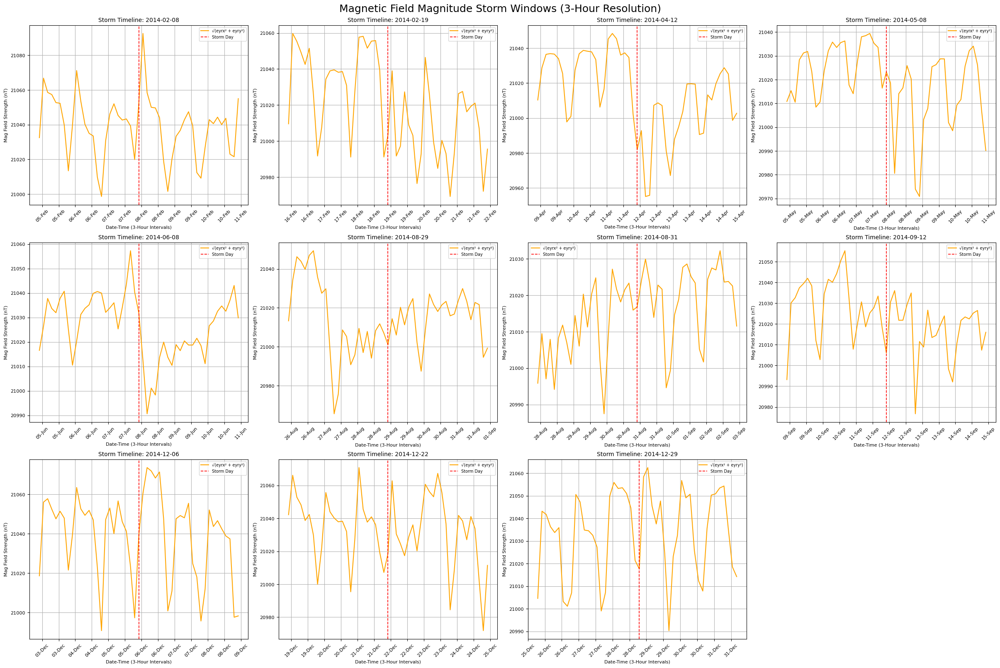

In [43]:
from datetime import timedelta
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# STEP 1: Calculate magnitude if needed
mag_df_3h["mag_magnitude"] = np.sqrt(mag_df_3h["eyrx"]**2 + mag_df_3h["eyry"]**2)

# STEP 2: Identify storm days using normalized index (K >= 5)
storm_days = k_df[(k_df["1"] >= 5) | (k_df["2"] >= 5) | (k_df["3"] >= 5) | 
                  (k_df["4"] >= 5) | (k_df["5"] >= 5) | (k_df["6"] >= 5) | 
                  (k_df["7"] >= 5) | (k_df["8"] >= 5)].index.normalize().unique()

# STEP 3: Plot all storms in grid
n_storms = len(storm_days)
ncols = 4
nrows = int(np.ceil(n_storms / ncols))

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(24, 16), constrained_layout=True)
axs = axs.flatten()

for i, storm_day in enumerate(storm_days):
    ax = axs[i]
    start = storm_day - timedelta(days=3)
    end = storm_day + timedelta(days=3)

    window_df = mag_df_3h[(mag_df_3h["datetime"] >= start) & (mag_df_3h["datetime"] <= end)].copy()

    ax.plot(window_df["datetime"], window_df["mag_magnitude"],
            color='orange', linewidth=1.5, label=r'√(eyrx² + eyry²)')
    ax.axvline(storm_day, color='red', linestyle='--', linewidth=1.2, label="Storm Day")

    ax.set_title(f"Storm Timeline: {storm_day.strftime('%Y-%m-%d')}", fontsize=10)
    ax.set_xlabel("Date-Time (3-Hour Intervals)", fontsize=8)
    ax.set_ylabel("Mag Field Strength (nT)", fontsize=8)
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=12))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.tick_params(axis='x', rotation=45, labelsize=8)
    ax.tick_params(axis='y', labelsize=8)
    ax.grid(True)
    ax.legend(fontsize=7)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle("Magnetic Field Magnitude Storm Windows (3-Hour Resolution)", fontsize=18)
plt.show()


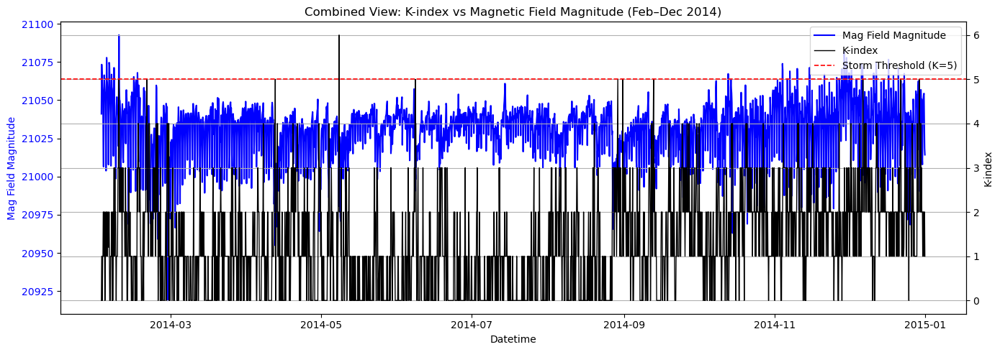

,YR,MTH,DAY,date,interval,k_value,hour_offset,datetime,K_value,eyrx,...,dEyRx_dt,dEyRy_dt,dEyRx_dt_smoothed,dEyRy_dt_smoothed,dMag_dt,dMag_dt_smoothed,dHdt_magnitude,dHdt_smooth,mag,mag_smooth
0,2014,2,1,2014-02-01,1,0.0,0,2014-02-01 00:00:00,0.0,19277.88,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21041.027209,NaN
1,2014,2,1,2014-02-01,2,1.0,3,2014-02-01 03:00:00,1.0,19315.74,...,0.210333,-0.033444,NaN,NaN,12.778541,NaN,0.212976,NaN,21073.312575,21060.809722
2,2014,2,1,2014-02-01,3,1.0,6,2014-02-01 06:00:00,1.0,19319.93,...,0.023278,-0.126111,3.915556,-4.008889,7.694486,7.938481,0.128241,7.938481,21068.089384,21066.770462
3,2014,2,1,2014-02-01,4,0.0,9,2014-02-01 09:00:00,0.0,19313.12,...,-0.037833,-0.040889,-0.453333,-4.008889,3.342416,4.367247,0.055707,4.367247,21058.909426,21060.723310
4,2014,2,1,2014-02-01,5,1.0,12,2014-02-01 12:00:00,1.0,19311.66,...,-0.008111,-0.033444,-0.857778,-1.893333,2.064838,2.213651,0.034414,2.213651,21055.171120,21056.099375
5,2014,2,1,2014-02-01,6,1.0,15,2014-02-01 15:00:00,1.0,19312.21,...,0.003056,-0.020333,-2.007778,-5.022222,1.233698,5.482611,0.020562,5.482611,21054.217579,21044.578231
6,2014,2,1,2014-02-01,7,2.0,18,2014-02-01 18:00:00,2.0,19295.05,...,-0.095333,-0.197333,-5.097778,-1.852222,13.149297,8.897075,0.219155,8.897075,21024.345995,21028.337347
7,2014,2,1,2014-02-01,8,2.0,21,2014-02-01 21:00:00,2.0,19265.78,...,-0.162611,0.125056,-3.784444,6.532222,12.308231,16.581152,0.205137,16.581152,21006.448468,21025.764547
8,2014,2,2,2014-02-02,1,1.0,0,2014-02-02 00:00:00,1.0,19278.15,...,0.068722,0.398889,1.466667,8.333333,24.285928,16.171555,0.404765,16.171555,21046.499178,21039.763712
9,2014,2,2,2014-02-02,2,2.0,3,2014-02-02 03:00:00,2.0,19308.25,...,0.167222,-0.107278,5.572222,2.672222,11.920506,15.342002,0.198675,15.342002,21066.343491,21058.290440


In [44]:
# Step 1: Merge on Common 3-hour Timestamps
merged_df = pd.merge(k_long, mag_df_3h, on="datetime", how="inner")

# Ensure 'datetime' is a column and in datetime64 format
if 'datetime' not in merged_df.columns:
    merged_df.reset_index(inplace=True)
merged_df['datetime'] = pd.to_datetime(merged_df['datetime'])

# Calculate magnitude if needed
merged_df["mag_magnitude"] = (merged_df["eyrx"]**2 + merged_df["eyry"]**2)**0.5

# Add magnitude + smoothed fields to merged_df (AFTER merge!)
merged_df["mag"] = np.sqrt(merged_df["eyrx"]**2 + merged_df["eyry"]**2)
merged_df["mag_smooth"] = merged_df["mag_magnitude"].rolling(window=3, center=True).mean()

merged_df["dEyRx_dt"] = merged_df["eyrx"].diff() / 180  # assuming 3h steps = 180 minutes
merged_df["dEyRy_dt"] = merged_df["eyry"].diff() / 180
merged_df["dHdt_magnitude"] = np.sqrt(merged_df["dEyRx_dt"]**2 + merged_df["dEyRy_dt"]**2)

# STEP 2: Plot Combined View (K-index vs Magnetic Magnitude)
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots(figsize=(14, 5))

# Plot magnetic magnitude
ax1.plot(merged_df["datetime"], merged_df["mag_magnitude"], color='blue', label="Mag Field Magnitude")
ax1.set_xlabel("Datetime")
ax1.set_ylabel("Mag Field Magnitude", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create second axis for K-index
ax2 = ax1.twinx()
ax2.plot(merged_df["datetime"], merged_df["k_value"], color='black', label="K-index", linewidth=1)
ax2.set_ylabel("K-index", color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Storm threshold (K ≥ 5)
ax2.axhline(y=5, color='red', linestyle='--', linewidth=1.2, label="Storm Threshold (K=5)")

# Add legends
fig.legend(loc="upper right", bbox_to_anchor=(1, 1), bbox_transform=ax1.transAxes)
plt.title("Combined View: K-index vs Magnetic Field Magnitude (Feb–Dec 2014)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Preview
display(merged_df.head(20))


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\1489767111.py:56: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.tight_layout(rect=[0, 0, 1, 0.96])
c:\Users\Acer\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


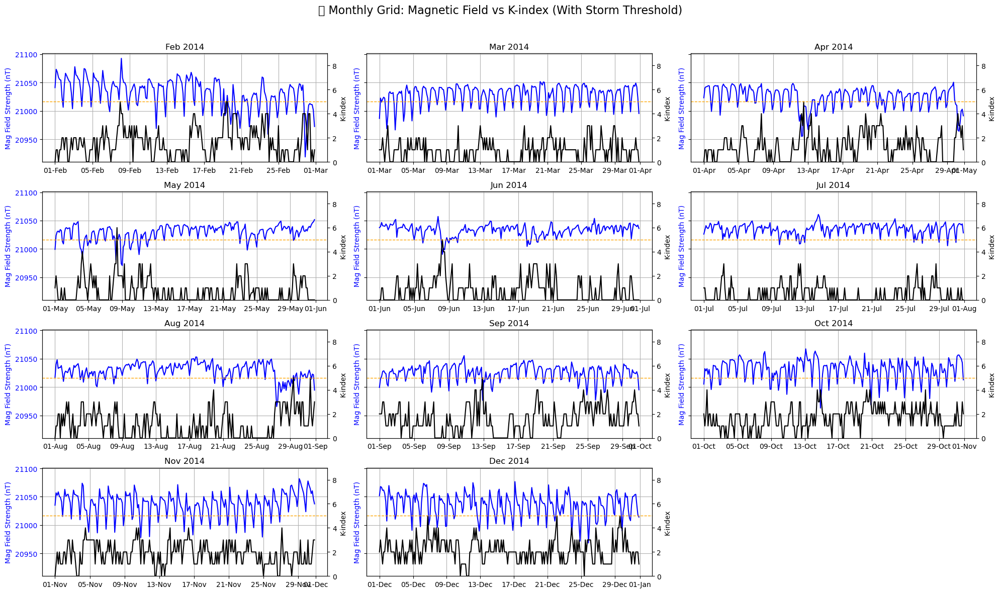

In [45]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Set smoothing option
use_smoothing = False  # Set to True if you want a smoothed magnetic field

# Add month and year columns
merged_df["month"] = merged_df["datetime"].dt.month
merged_df["year"] = merged_df["datetime"].dt.year

# Extract all months available
months = merged_df["datetime"].dt.to_period("M").unique().to_timestamp()
n_months = len(months)

# Grid settings
ncols = 3
nrows = int(np.ceil(n_months / ncols))

# Create plot grid
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 12), sharey=True)
axes = axes.flatten()

for i, month_start in enumerate(months):
    ax1 = axes[i]
    month_end = (month_start + pd.offsets.MonthEnd(1)).replace(hour=23, minute=59)

    # Slice data for this month
    month_data = merged_df[(merged_df["datetime"] >= month_start) & (merged_df["datetime"] <= month_end)]

    # Plot raw or smoothed magnetic field
    if use_smoothing:
        ax1.plot(month_data["datetime"], month_data["mag_smooth"], label="Smoothed Mag (3h MA)", color='red', linestyle='--')
    else:
        ax1.plot(month_data["datetime"], month_data["mag_magnitude"], label="Mag Field Magnitude", color='blue')

    ax1.set_ylabel("Mag Field Strength (nT)", color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title(month_start.strftime('%b %Y'))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax1.grid(True)

    # Plot K-index on secondary axis
    ax2 = ax1.twinx()
    ax2.plot(month_data["datetime"], month_data["k_value"], label="K-index (3h)", color='black', linewidth=1.5)
    ax2.axhline(5, color='orange', linestyle='--', linewidth=1, label="Storm Threshold (K=5)")
    ax2.set_ylabel("K-index", color='black')
    ax2.set_ylim(0, 9)
    ax2.tick_params(axis='y', labelcolor='black')

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Final layout
fig.suptitle("📊 Monthly Grid: Magnetic Field vs K-index (With Storm Threshold)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


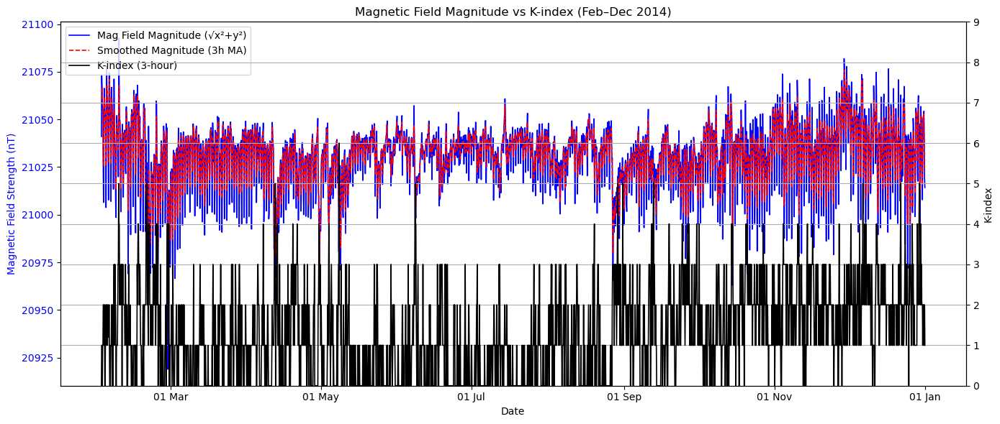

In [46]:
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

# Plot with twin axes
fig, ax1 = plt.subplots(figsize=(14, 6))

# Plot magnetic magnitude (left y-axis)
ax1.plot(merged_df["datetime"], merged_df["mag_magnitude"], color='blue', linewidth=1.2, label='Mag Field Magnitude (√x²+y²)')
ax1.plot(merged_df["datetime"], merged_df["mag_smooth"], 'r--', linewidth=1.2, label='Smoothed Magnitude (3h MA)')
ax1.set_ylabel("Magnetic Field Strength (nT)", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Add second y-axis for K-index
ax2 = ax1.twinx()
ax2.plot(merged_df["datetime"], merged_df["k_value"], color='black', linewidth=1.2, label='K-index (3-hour)')
ax2.set_ylabel("K-index", color='black')
ax2.tick_params(axis='y', labelcolor='black')
ax2.set_ylim(0, 9)  # Limit K-index axis

# X-axis formatting
ax1.set_xlabel("Date")
ax1.set_title("Magnetic Field Magnitude vs K-index (Feb–Dec 2014)")
ax1.xaxis.set_major_formatter(DateFormatter('%d %b'))

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper left")

plt.tight_layout()
plt.grid(True)
plt.show()


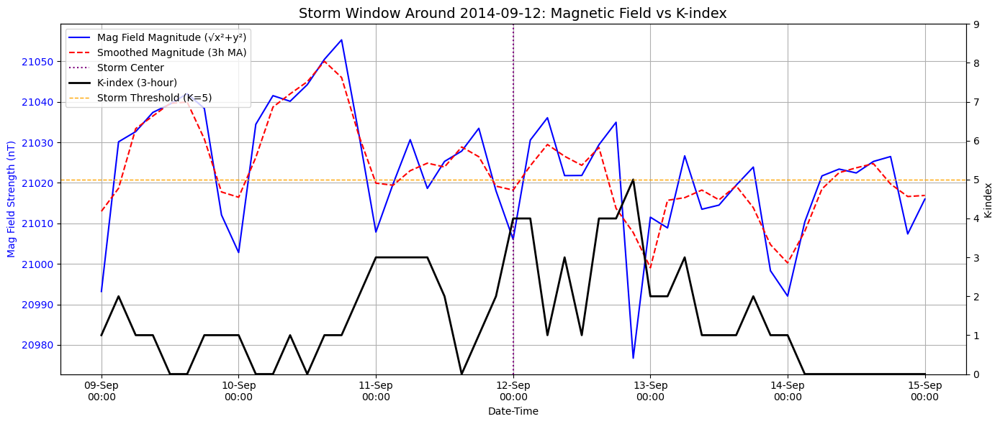

In [48]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import timedelta

# Example: pick one storm date from your storm day index
storm_day = pd.to_datetime("2014-09-12")  # Change to any real storm date from your data

# Define time window: 3 days before and after
start = storm_day - timedelta(days=3)
end = storm_day + timedelta(days=3)

# Filter data for that window
storm_window = merged_df[(merged_df["datetime"] >= start) & (merged_df["datetime"] <= end)]

# Start plot
fig, ax1 = plt.subplots(figsize=(14, 6))

# --- Magnetic Field Plot (Primary y-axis)
ax1.plot(storm_window["datetime"], storm_window["mag_magnitude"], label='Mag Field Magnitude (√x²+y²)', color='blue')
ax1.plot(storm_window["datetime"], storm_window["mag_smooth"], label='Smoothed Magnitude (3h MA)', color='red', linestyle='--')
ax1.set_ylabel("Mag Field Strength (nT)", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# --- K-index Plot (Secondary y-axis)
ax2 = ax1.twinx()
ax2.plot(storm_window["datetime"], storm_window["k_value"], label='K-index (3-hour)', color='black', linewidth=2)
ax2.axhline(5, color='orange', linestyle='--', linewidth=1, label='Storm Threshold (K=5)')
ax2.set_ylabel("K-index", color='black')
ax2.set_ylim(0, 9)
ax2.tick_params(axis='y', labelcolor='black')

# --- Storm window indicator (optional shaded background)
ax1.axvline(storm_day, color='purple', linestyle=':', linewidth=1.5, label="Storm Center")

# Title and formatting
ax1.set_title(f"Storm Window Around {storm_day.date()}: Magnetic Field vs K-index", fontsize=14)
ax1.set_xlabel("Date-Time")
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M'))
ax1.grid(True)

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\3346040172.py:57: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.tight_layout(rect=[0, 0, 1, 0.96])


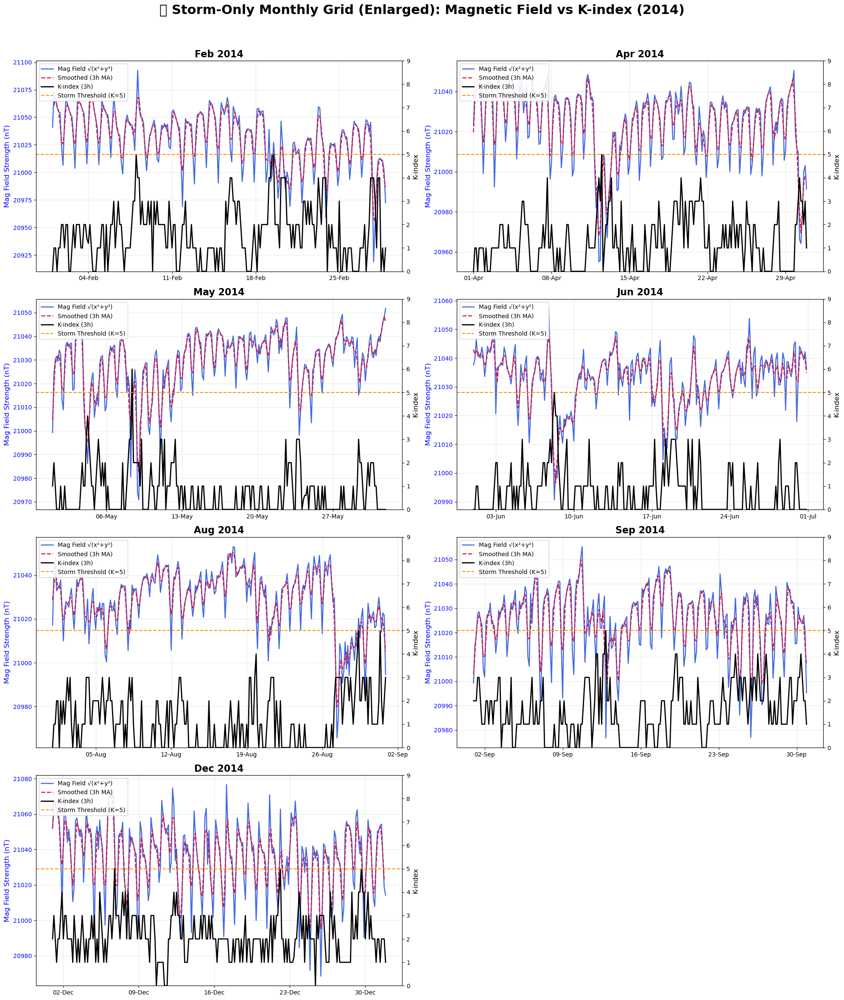

In [49]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Extract storm months from K-index
storm_days = merged_df[merged_df['k_value'] >= 5]['datetime'].dt.date.unique()
storm_months = sorted(set(d.month for d in storm_days))

# Month labels
month_names = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# Grid size: fewer columns for larger subplots
n_months = len(storm_months)
ncols = 2  # Fewer columns → bigger individual plots
nrows = int(np.ceil(n_months / ncols))

# Bigger canvas
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 6), sharey=False)
axes = axes.flatten()

for i, month in enumerate(storm_months):
    ax1 = axes[i]
    month_df = merged_df[merged_df['datetime'].dt.month == month].copy()

    # Plot magnetic field magnitude
    ax1.plot(month_df['datetime'], month_df['mag_magnitude'], color='royalblue', linewidth=1.8, label='Mag Field √(x²+y²)')
    ax1.plot(month_df['datetime'], month_df['mag_smooth'], color='crimson', linestyle='--', linewidth=1.8, label='Smoothed (3h MA)')
    ax1.set_ylabel("Mag Field Strength (nT)", color='blue', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='blue')

    # Secondary axis for K-index
    ax2 = ax1.twinx()
    ax2.plot(month_df['datetime'], month_df['k_value'], color='black', linewidth=2, label='K-index (3h)')
    ax2.axhline(5, color='darkorange', linestyle='--', linewidth=1.5, label='Storm Threshold (K=5)')
    ax2.set_ylim(0, 9)
    ax2.set_ylabel("K-index", color='black', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='black')

    # Title and formatting
    ax1.set_title(f"{month_names[month - 1]} 2014", fontsize=16, weight='bold')
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax1.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    ax1.grid(True, alpha=0.3)

    # Combined legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, fontsize=10, loc='upper left', framealpha=0.9)

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Global title and tight layout
fig.suptitle("📊 Storm-Only Monthly Grid (Enlarged): Magnetic Field vs K-index (2014)", fontsize=22, weight='bold')
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Confusion Matrix:
[[502 296]
 [151 647]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.63      0.69       798
           1       0.69      0.81      0.74       798

    accuracy                           0.72      1596
   macro avg       0.73      0.72      0.72      1596
weighted avg       0.73      0.72      0.72      1596


AUC ROC Score: 0.74


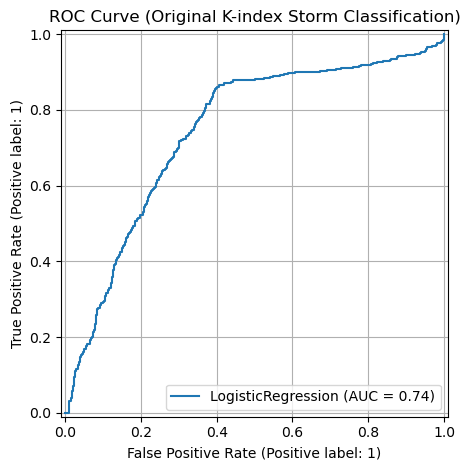

In [50]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay
import matplotlib.pyplot as plt

# STEP 1: Prepare Data (original K-index)
model_df_orig = merged_df.copy()
model_df_orig["hour"] = model_df_orig["datetime"].dt.hour
model_df_orig["month"] = model_df_orig["datetime"].dt.month

# Use the original K-index label (assuming column is 'k_value')
model_df_orig["storm_label"] = (model_df_orig["k_value"] >= 5).astype(int)

X_orig = model_df_orig[["eyrx", "eyry", "mag_magnitude", "hour", "month"]]
y_orig = model_df_orig["storm_label"]

# STEP 2: Balance Classes
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_orig, y_orig)

# STEP 3: Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=42, stratify=y_res)

# STEP 4: Train Model
clf = LogisticRegression(max_iter=1000)
clf.fit(X_train, y_train)

# STEP 5: Predict & Evaluate
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:, 1]

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nAUC ROC Score: {roc_auc_score(y_test, y_prob):.2f}")

# STEP 6: Plot ROC Curve
RocCurveDisplay.from_estimator(clf, X_test, y_test)
plt.title("ROC Curve (Original K-index Storm Classification)")
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\1804082313.py:38: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  refined_df["k_value"].fillna(0, inplace=True)
C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\1804082313.py:39: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exampl

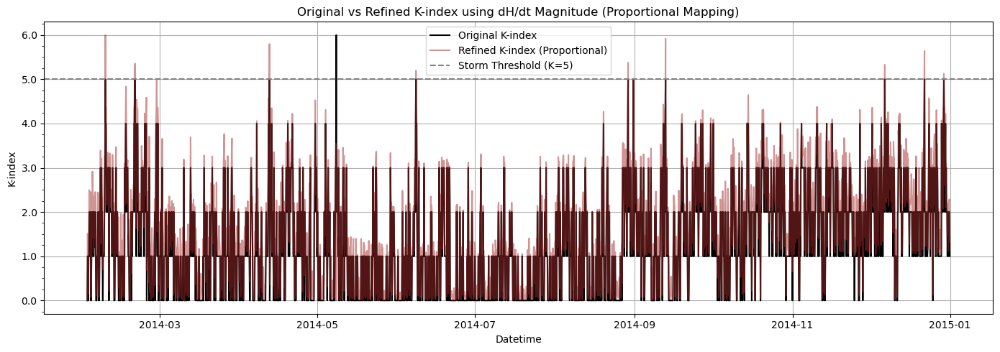

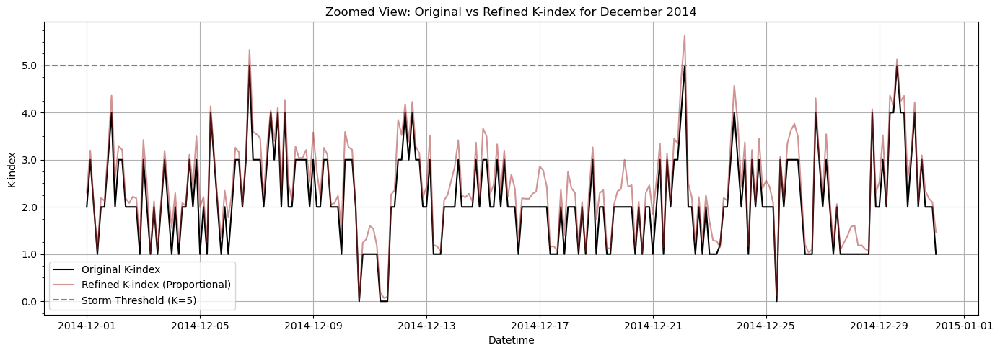

,datetime,k_value,dHdt_magnitude,H_bin,H_bin_frac,refined_K
0,2014-02-01 00:00:00,0.0,0.000000,0,0.000000,0.000000
1,2014-02-01 03:00:00,1.0,0.212976,1,0.511163,1.511163
2,2014-02-01 06:00:00,1.0,0.128241,1,0.306781,1.306781
3,2014-02-01 09:00:00,0.0,0.055707,0,0.149239,0.149239
4,2014-02-01 12:00:00,1.0,0.034414,1,0.080465,1.080465
5,2014-02-01 15:00:00,1.0,0.020562,1,0.047053,1.047053
6,2014-02-01 18:00:00,2.0,0.219155,2,0.496981,2.496981
7,2014-02-01 21:00:00,2.0,0.205137,2,0.464330,2.464330
8,2014-02-02 00:00:00,1.0,0.404765,1,0.973767,1.973767
9,2014-02-02 03:00:00,2.0,0.198675,2,0.449277,2.449277


In [51]:
# Refine K-index Using Magnetic dH/dt Magnitude within H-Bins 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Step 1: Create a new DataFrame for refinement
refined_df = merged_df.copy()

# Step 2: Define H-bin thresholds (can be used for plotting or future logic)
h_thresholds = [0, 5, 10, 20, 40, 70, 120, 200, np.inf]  # 9 bins for K = 0 to 8

# Step 3: Assign each row to a K-bin based on original k_value
refined_df["H_bin"] = refined_df["k_value"].astype(int).clip(0, 8)

# Step 4: For each bin, get min and max of dHdt_magnitude
bin_stats = refined_df.groupby("H_bin")["dHdt_magnitude"].agg(["min", "max"]).reset_index()
bin_stats.columns = ["H_bin", "H_min", "H_max"]

# Remove old versions of H_min, H_max if present
refined_df = refined_df.drop(columns=['H_min', 'H_max'], errors='ignore')

# Step 5: Merge stats back into the refined_df
refined_df = pd.merge(refined_df, bin_stats, on="H_bin", how="left")

# Step 6: Avoid divide-by-zero errors if H_max == H_min
refined_df["H_bin_range"] = (refined_df["H_max"] - refined_df["H_min"]).replace(0, np.nan)

# Step 7: Compute fractional K within each bin
refined_df["H_bin_frac"] = (
    (refined_df["dHdt_magnitude"] - refined_df["H_min"]) / refined_df["H_bin_range"]
).clip(0, 0.999)

# Step 8: Final refined K = bin base + fractional offset
refined_df["refined_K"] = refined_df["H_bin"] + refined_df["H_bin_frac"]

# Step 9: Fill missing values if any
refined_df["k_value"].fillna(0, inplace=True)
refined_df["refined_K"].fillna(0, inplace=True)
refined_df.fillna(0, inplace=True)

# If refined_K is still 0, zero-out contributing columns
nan_mask = refined_df["refined_K"] == 0.0
refined_df.loc[nan_mask, ["dHdt_magnitude", "H_bin", "H_bin_frac"]] = 0.0

# Step 10: Plot original vs refined K-index
plt.figure(figsize=(14, 5))
plt.plot(refined_df["datetime"], refined_df["k_value"], color="black", label="Original K-index")
plt.plot(refined_df["datetime"], refined_df["refined_K"], color="brown", alpha=0.5, label="Refined K-index (Proportional)")
plt.axhline(5, color="gray", linestyle="--", label="Storm Threshold (K=5)")
plt.xlabel("Datetime")
plt.ylabel("K-index")
plt.gca().yaxis.set_major_locator(ticker.MultipleLocator(1))``
plt.gca().yaxis.set_minor_locator(ticker.MultipleLocator(0.25))
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
plt.title("Original vs Refined K-index using dH/dt Magnitude (Proportional Mapping)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 11: Zoom into a specific month (e.g., December 2014)
start_date = "2014-12-01"
end_date = "2014-12-31"
december_df = refined_df[(refined_df["datetime"] >= start_date) & (refined_df["datetime"] <= end_date)]

# Plot zoomed view
plt.figure(figsize=(14, 5))
plt.plot(december_df["datetime"], december_df["k_value"], color="black", label="Original K-index")
plt.plot(december_df["datetime"], december_df["refined_K"], color="brown", alpha=0.5, label="Refined K-index (Proportional)")
plt.axhline(5, color="gray", linestyle="--", label="Storm Threshold (K=5)")
plt.title("Zoomed View: Original vs Refined K-index for December 2014")
plt.xlabel("Datetime")
plt.ylabel("K-index")
plt.gca().yaxis.set_major_locator(ticker.MultipleLocator(1))
plt.gca().yaxis.set_minor_locator(ticker.MultipleLocator(0.25))
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter("%.1f"))
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 12: Preview output
display(refined_df[["datetime", "k_value", "dHdt_magnitude", "H_bin", "H_bin_frac", "refined_K"]].head(20))


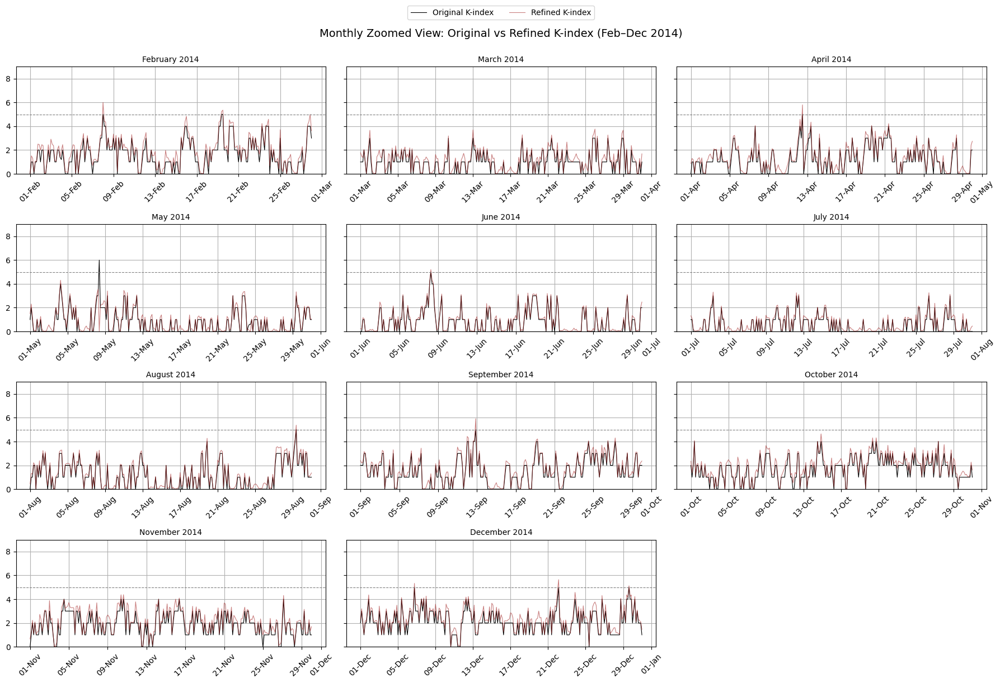

In [52]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Define month labels and corresponding date ranges
month_ranges = pd.date_range("2014-02-01", "2014-12-31", freq="MS")
n_months = len(month_ranges)

# Prepare subplots — 3 columns, ceil(n_months / 3) rows
n_cols = 3
n_rows = int(np.ceil(n_months / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), sharey=True)
axes = axes.flatten()

# Plot each month's data
for i, month_start in enumerate(month_ranges):
    month_end = (month_start + pd.offsets.MonthEnd(1))
    month_label = month_start.strftime("%B %Y")
    month_data = refined_df[(refined_df["datetime"] >= month_start) & (refined_df["datetime"] <= month_end)]

    ax = axes[i]
    ax.plot(month_data["datetime"], month_data["k_value"], color="black", linewidth=0.8, label="Original K-index")
    ax.plot(month_data["datetime"], month_data["refined_K"], color="brown", alpha=0.6, linewidth=0.8, label="Refined K-index")
    ax.axhline(5, color="gray", linestyle="--", linewidth=0.8)

    ax.set_title(month_label, fontsize=10)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%b"))
    ax.tick_params(axis='x', labelrotation=45)
    ax.set_ylim(0, 9)
    ax.grid(True)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Shared labels and legend
fig.suptitle("Monthly Zoomed View: Original vs Refined K-index (Feb–Dec 2014)", fontsize=14)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=2, bbox_to_anchor=(0.5, 1.02))
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


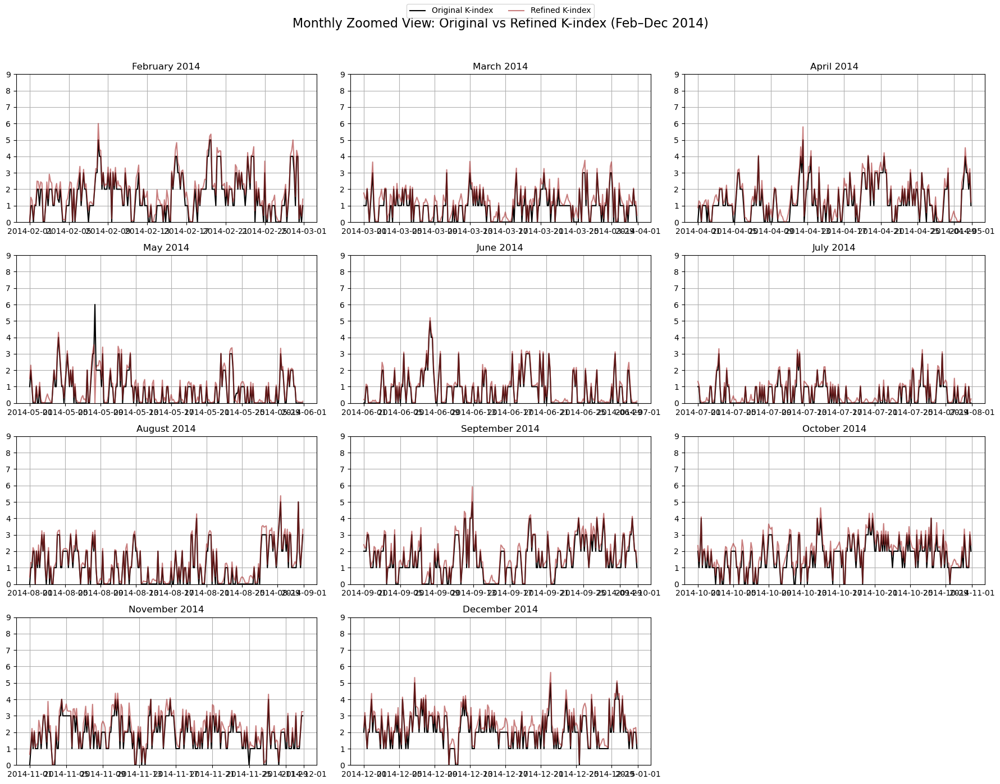

In [53]:
import matplotlib.pyplot as plt
import calendar
import matplotlib.ticker as ticker

# Step: Monthly zoomed plots (grid layout)
months = list(range(2, 13))  # February (2) to December (12)
n_months = len(months)
n_cols = 3
n_rows = int(np.ceil(n_months / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 14), sharex=False)
axes = axes.flatten()

for i, month in enumerate(months):
    ax = axes[i]
    month_data = refined_df[refined_df["datetime"].dt.month == month]
    ax.plot(month_data["datetime"], month_data["k_value"], color="black", label="Original K-index")
    ax.plot(month_data["datetime"], month_data["refined_K"], color="brown", alpha=0.6, label="Refined K-index")
    ax.set_title(f"{calendar.month_name[month]} 2014")
    ax.set_ylim(0, 9)
    ax.grid(True)

# Turn off any unused subplots
for j in range(n_months, len(axes)):
    fig.delaxes(axes[j])

# Add a main title and legend
fig.suptitle("Monthly Zoomed View: Original vs Refined K-index (Feb–Dec 2014)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
fig.legend(["Original K-index", "Refined K-index"], loc="upper center", ncol=2)

plt.show()


In [54]:
# Classify storms: K >= 5
refined_df["storm_original"] = refined_df["k_value"] >= 5
refined_df["storm_refined"] = refined_df["refined_K"] >= 5

# Calculate agreement statistics
total_points = len(refined_df)
agreement = (refined_df["storm_original"] == refined_df["storm_refined"]).sum()
disagreements = total_points - agreement
print(f"Storm Agreement: {agreement}/{total_points} ({agreement/total_points:.2%})")
print(f"Disagreements: {disagreements}")


Storm Agreement: 2671/2672 (99.96%)
Disagreements: 1


In [55]:
correlation = refined_df[["k_value", "refined_K"]].corr().iloc[0,1]
print(f"Pearson correlation between K and refined K: {correlation:.3f}")


Pearson correlation between K and refined K: 0.982


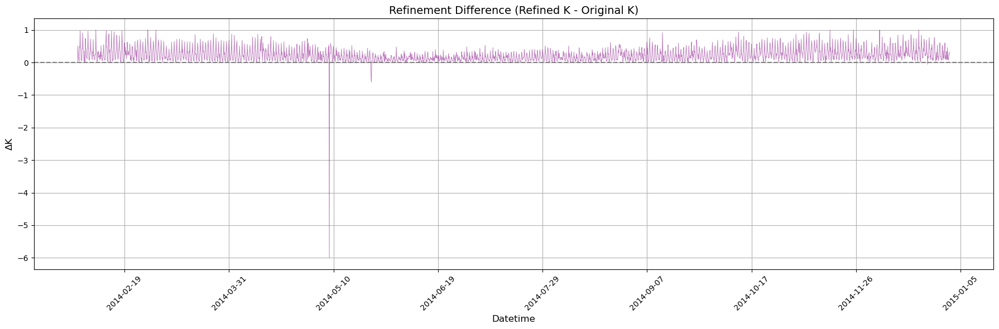

In [56]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))  # Wider and taller
plt.plot(refined_df["datetime"], refined_df["refined_K"] - refined_df["k_value"],
         color='purple', alpha=0.5, linewidth=0.7)
plt.axhline(0, color='gray', linestyle='--')
plt.title("Refinement Difference (Refined K - Original K)", fontsize=14)
plt.ylabel("ΔK", fontsize=12)
plt.xlabel("Datetime", fontsize=12)

# Format date ticks to show fewer labels
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(12))  # 12 x-ticks max
plt.grid(True)
plt.tight_layout()
plt.show()



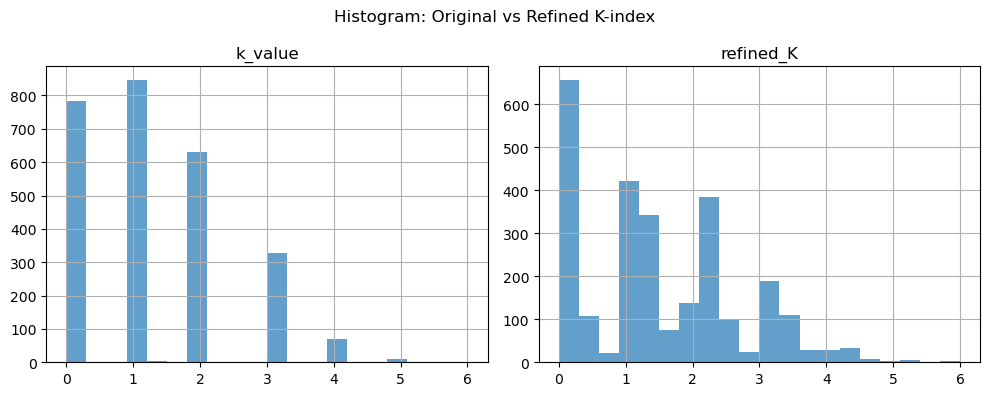

In [57]:
refined_df[["k_value", "refined_K"]].hist(bins=20, figsize=(10, 4), alpha=0.7)
plt.suptitle("Histogram: Original vs Refined K-index")
plt.tight_layout()
plt.show()


Confusion Matrix:
[[600 199]
 [190 609]]

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.75      0.76       799
           1       0.75      0.76      0.76       799

    accuracy                           0.76      1598
   macro avg       0.76      0.76      0.76      1598
weighted avg       0.76      0.76      0.76      1598

AUC ROC Score: 0.83


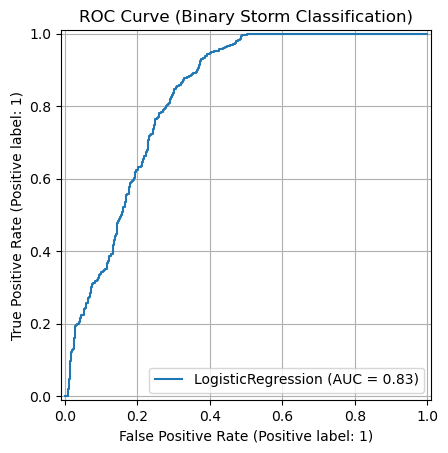

In [58]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay
import matplotlib.pyplot as plt

# STEP 1: Prepare Data
refined_df["hour"] = refined_df["datetime"].dt.hour
refined_df["month"] = refined_df["datetime"].dt.month
model_df = refined_df[["dHdt_magnitude", "H_bin_frac", "hour", "month"]].copy()
model_df["storm_label"] = (refined_df["refined_K"] > 5).astype(int)

# STEP 2: Features and Label
X = model_df[["dHdt_magnitude", "H_bin_frac", "hour", "month"]]
y = model_df["storm_label"]

# STEP 3: Balance Classes with SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# STEP 4: Split Data
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=42, stratify=y_res)

# STEP 5: Train Model
clf = LogisticRegression(max_iter=1000)
clf.fit(X_train, y_train)

# STEP 6: Evaluate
y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:, 1]

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"AUC ROC Score: {roc_auc_score(y_test, y_prob):.2f}")

# STEP 7: Plot ROC
RocCurveDisplay.from_estimator(clf, X_test, y_test)
plt.title("ROC Curve (Binary Storm Classification)")
plt.grid(True)
plt.show()

Feature Importance (Coefficients):
dHdt_magnitude    11.723318
H_bin_frac         1.600319
hour               0.050191
month             -0.089800
dtype: float64


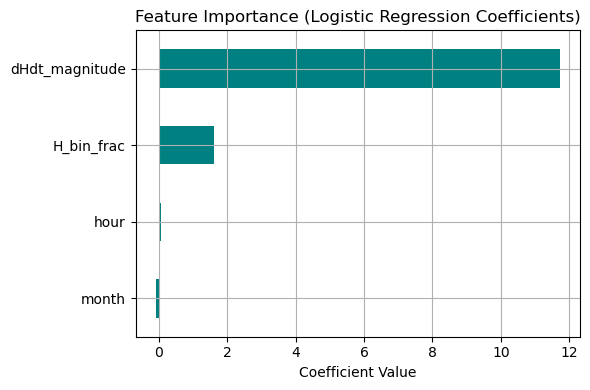

In [59]:
# Print and plot logistic regression feature importance
import pandas as pd
import matplotlib.pyplot as plt

feature_importance = pd.Series(clf.coef_[0], index=X.columns)
print("Feature Importance (Coefficients):")
print(feature_importance.sort_values(ascending=False))

# Plot
feature_importance.sort_values().plot(kind="barh", figsize=(6, 4), color='teal')
plt.title("Feature Importance (Logistic Regression Coefficients)")
plt.xlabel("Coefficient Value")
plt.tight_layout()
plt.grid(True)
plt.show()


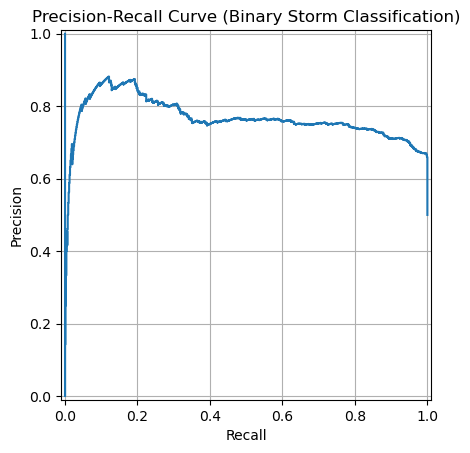

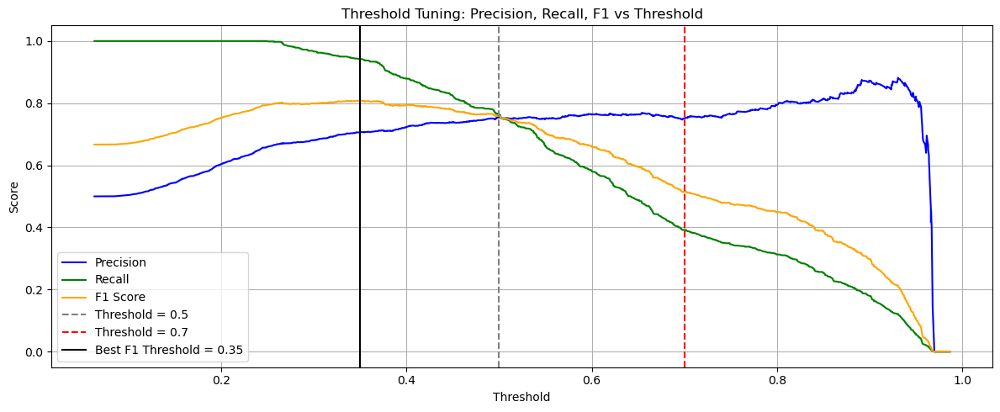

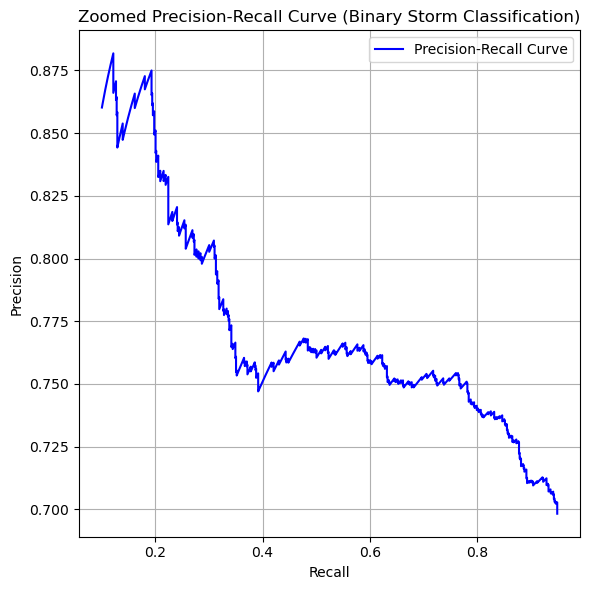


Best threshold based on F1-score: 0.35

Adjusted Threshold (=0.33) Confusion Matrix:
[[472 327]
 [ 40 759]]

Adjusted Threshold (=0.33) Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.59      0.72       799
           1       0.70      0.95      0.81       799

    accuracy                           0.77      1598
   macro avg       0.81      0.77      0.76      1598
weighted avg       0.81      0.77      0.76      1598



In [60]:
# Step 1: Get predicted probabilities
y_prob = clf.predict_proba(X_test)[:, 1]

# Step 2: Compute precision-recall pairs
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay, f1_score

precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

# Step 3: Compute F1-scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-8)

# Step 4: Plot Precision-Recall Curve
disp = PrecisionRecallDisplay(precision=precision, recall=recall)
disp.plot()
plt.title("Precision-Recall Curve (Binary Storm Classification)")
plt.grid(True)
plt.show()

# Step 5: Plot all metrics across thresholds
plt.figure(figsize=(12, 5))
plt.plot(thresholds, precision[:-1], label='Precision', color='blue')
plt.plot(thresholds, recall[:-1], label='Recall', color='green')
plt.plot(thresholds, f1_scores[:-1], label='F1 Score', color='orange')

# Mark common thresholds
plt.axvline(x=0.5, color='gray', linestyle='--', label='Threshold = 0.5')
plt.axvline(x=0.7, color='red', linestyle='--', label='Threshold = 0.7')

# Find and mark best threshold
best_index = f1_scores[:-1].argmax()
best_threshold = thresholds[best_index]
plt.axvline(x=best_threshold, color='black', linestyle='-', label=f'Best F1 Threshold = {best_threshold:.2f}')

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Threshold Tuning: Precision, Recall, F1 vs Threshold")
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay, f1_score

# Step 1: Get predicted probabilities
y_prob = clf.predict_proba(X_test)[:, 1]

# Step 2: Compute precision-recall values
precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

# Step 3: Zoomed Precision-Recall Plot (remove spikes)
plt.figure(figsize=(6, 6))

# Define valid range where recall and precision are stable
valid_range = (recall >= 0.1) & (recall <= 0.95)

# Plot trimmed curve
plt.plot(recall[valid_range], precision[valid_range], label="Precision-Recall Curve", color="blue")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Zoomed Precision-Recall Curve (Binary Storm Classification)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


# Step 6: Show best threshold value
print(f"\nBest threshold based on F1-score: {best_threshold:.2f}")
# Evaluate classification report for adjusted threshold
from sklearn.metrics import classification_report, confusion_matrix

# Adjust threshold (example: best threshold = 0.53)
threshold = 0.33
y_pred_adjusted = (y_prob > threshold).astype(int)

print(f"\nAdjusted Threshold (={threshold}) Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_adjusted))

print(f"\nAdjusted Threshold (={threshold}) Classification Report:")
print(classification_report(y_test, y_pred_adjusted, digits=2))






In [61]:
# Add true and predicted to df
eval_df = X_test.copy()
eval_df["true"] = y_test.values
eval_df["pred"] = y_pred
eval_df["prob"] = y_prob

# Show high probability false positives
false_positives = eval_df[(eval_df["true"] == 0) & (eval_df["pred"] == 1)]
print("High-confidence False Positives:")
print(false_positives.sort_values(by="prob", ascending=False).head(5))


High-confidence False Positives:
      dHdt_magnitude  H_bin_frac  hour  month  true  pred      prob
120         0.449928    0.833920     0      2     0     1  0.986271
104         0.402651    0.968668     0      2     0     1  0.980844
16          0.398331    0.914338     0      2     0     1  0.978080
2304        0.439320    0.999000     0     11     0     1  0.973558
183         0.325898    0.588206    21      2     0     1  0.970146


In [62]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, X_res, y_res, cv=5, scoring='roc_auc')
print("Cross-validated AUC:", scores.mean())


Cross-validated AUC: 0.7919466598050092


In [63]:
for col in X.columns:
    corr = np.corrcoef(model_df[col], model_df["storm_label"])[0, 1]
    print(f"{col} correlation with storm_label: {corr:.4f}")



dHdt_magnitude correlation with storm_label: 0.0814
H_bin_frac correlation with storm_label: 0.0844
hour correlation with storm_label: -0.0000
month correlation with storm_label: -0.0027


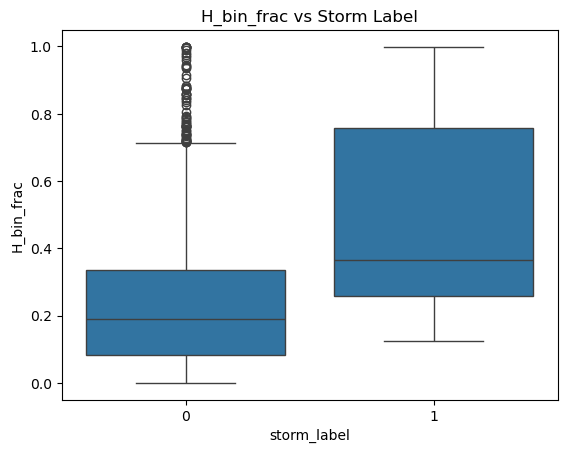

In [64]:
import seaborn as sns

sns.boxplot(x=model_df["storm_label"], y=model_df["H_bin_frac"])
plt.title("H_bin_frac vs Storm Label")
plt.show()


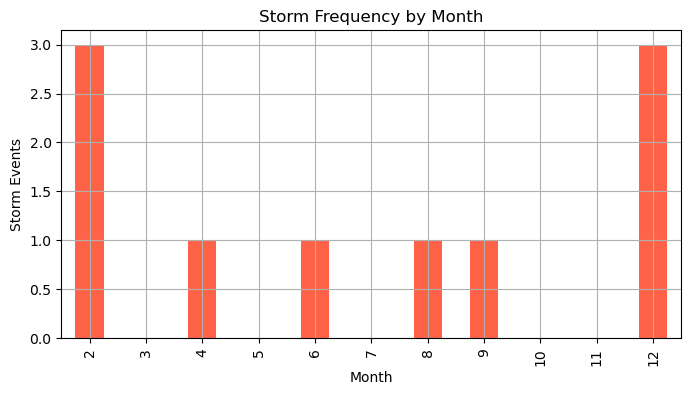

In [65]:
refined_df["storm_label"] = (refined_df["refined_K"] > 5).astype(int)
storm_counts = refined_df.groupby(refined_df["datetime"].dt.month)["storm_label"].sum()

plt.figure(figsize=(8, 4))
storm_counts.plot(kind="bar", color="tomato")
plt.title("Storm Frequency by Month")
plt.xlabel("Month")
plt.ylabel("Storm Events")
plt.grid(True)
plt.show()


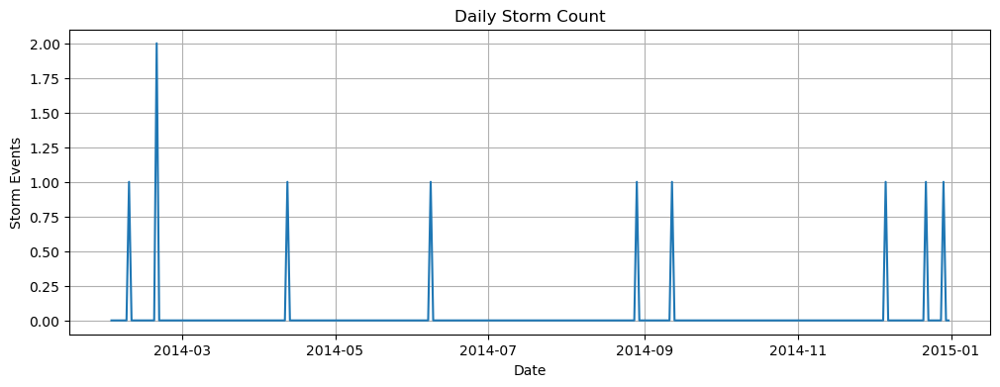

In [66]:
storm_daily = refined_df.groupby(refined_df["datetime"].dt.date)["storm_label"].sum()

plt.figure(figsize=(12, 4))
storm_daily.plot()
plt.title("Daily Storm Count")
plt.xlabel("Date")
plt.ylabel("Storm Events")
plt.grid(True)
plt.show()


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\179576937.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  december_df["hour"] = december_df["datetime"].dt.hour
C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\179576937.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  december_df["month"] = december_df["datetime"].dt.month
C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\179576937.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

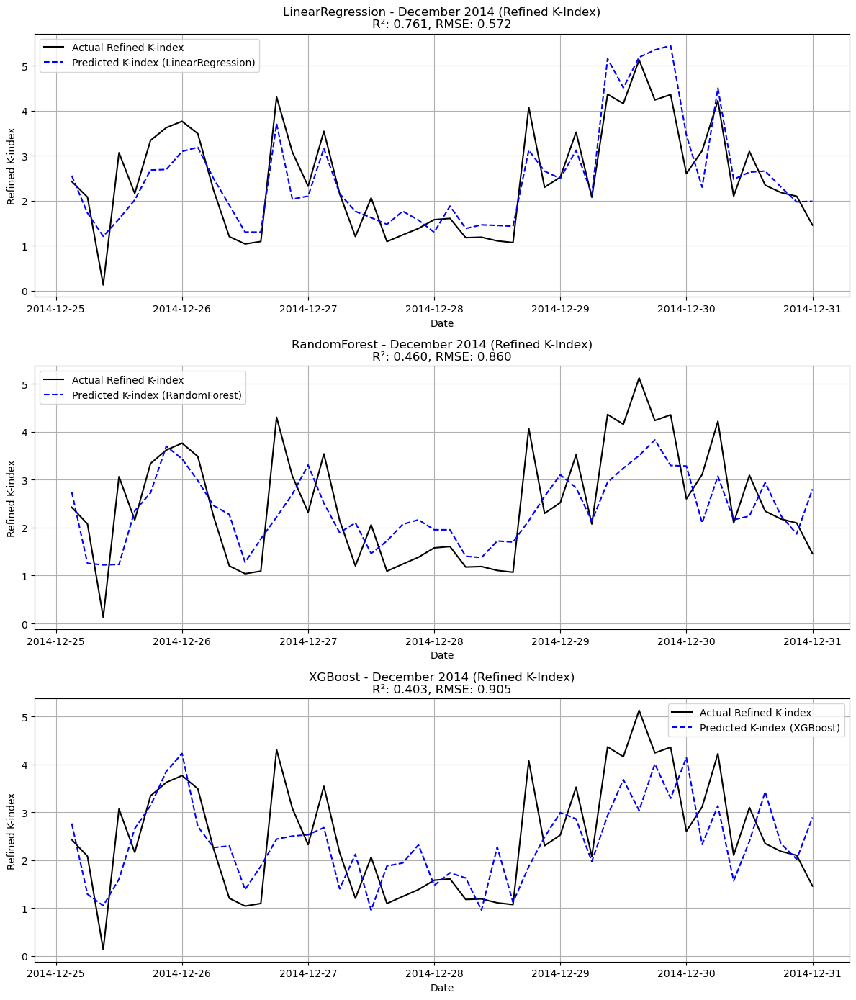

In [67]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

# STEP 1: Target & Features (already filtered for December)
december_df["hour"] = december_df["datetime"].dt.hour
december_df["month"] = december_df["datetime"].dt.month

# Add lag features
december_df["refined_k_lag1"] = december_df["refined_K"].shift(1)
december_df["refined_k_lag2"] = december_df["refined_K"].shift(2)
december_df["refined_k_lag3"] = december_df["refined_K"].shift(3)

# Add magnetic field diff features
december_df["eyrx_diff"] = december_df["eyrx"].diff()
december_df["eyry_diff"] = december_df["eyry"].diff()

# Drop missing rows due to shift/diff
december_df.dropna(inplace=True)

# Define features and target
features = [
    "refined_k_lag1", "refined_k_lag2", "refined_k_lag3",
    "eyrx", "eyry", "eyrx_diff", "eyry_diff",
    "dHdt_magnitude", "H_bin_frac", "hour", "month"
]

X = december_df[features]
y = december_df["refined_K"].values
dates = december_df["datetime"].values

# STEP 2: Train-Test Split (80/20, no shuffle to preserve order)
X_train, X_test, y_train, y_test, dates_train, dates_test = train_test_split(
    X, y, dates, test_size=0.2, shuffle=False
)

# STEP 3: Initialize Models
models = {
    "LinearRegression": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

# STEP 4: Train, Predict, Plot
plt.figure(figsize=(12, 14))

for i, (name, model) in enumerate(models.items(), 1):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    r2 = r2_score(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)

    plt.subplot(3, 1, i)
    plt.plot(dates_test, y_test, color='black', label="Actual Refined K-index")
    plt.plot(dates_test, y_pred, linestyle='--', color='blue', label=f"Predicted K-index ({name})")
    plt.title(f"{name} - December 2014 (Refined K-Index)\nR²: {r2:.3f}, RMSE: {rmse:.3f}")
    plt.xlabel("Date")
    plt.ylabel("Refined K-index")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()


C:\Users\Acer\AppData\Local\Temp\ipykernel_25592\3448794881.py:42: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  ax1.legend(bars, labels, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)


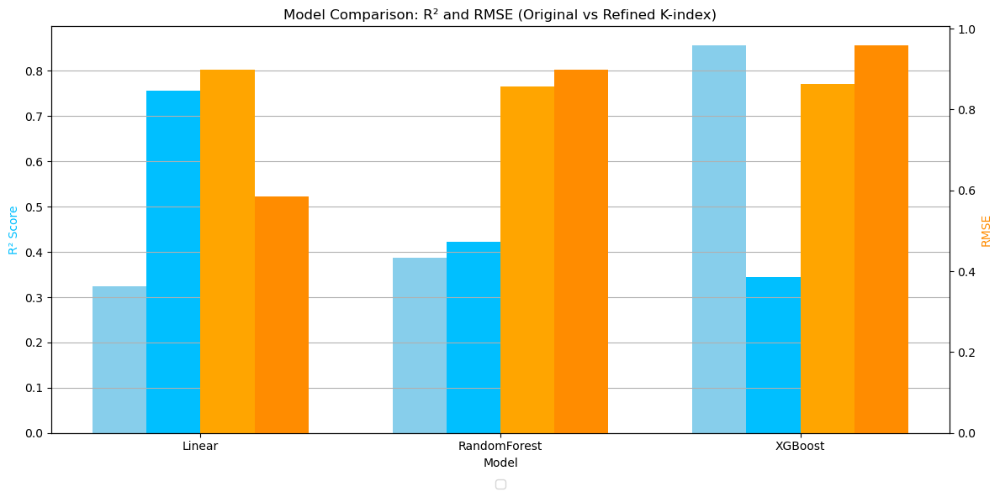

In [68]:
import matplotlib.pyplot as plt
import numpy as np

# Model names
models = ['Linear', 'RandomForest', 'XGBoost']

# R² values
r2_orig = [0.324, 0.387, 0.856]
r2_refined = [0.756, 0.422, 0.345]

# RMSE values
rmse_orig = [0.899, 0.856, 0.863]
rmse_refined = [0.584, 0.899, 0.958]

x = np.arange(len(models))  # model indices
width = 0.18  # bar width

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot R² bars
r2_orig_bar = ax1.bar(x - 1.5*width, r2_orig, width, label='R² Original', color='skyblue')
r2_ref_bar = ax1.bar(x - 0.5*width, r2_refined, width, label='R² Refined', color='deepskyblue')

# Create second y-axis for RMSE
ax2 = ax1.twinx()

# Plot RMSE bars
rmse_orig_bar = ax2.bar(x + 0.5*width, rmse_orig, width, label='RMSE Original', color='orange')
rmse_ref_bar = ax2.bar(x + 1.5*width, rmse_refined, width, label='RMSE Refined', color='darkorange')

# Labels and titles
ax1.set_xlabel('Model')
ax1.set_ylabel('R² Score', color='deepskyblue')
ax2.set_ylabel('RMSE', color='darkorange')
ax1.set_title('Model Comparison: R² and RMSE (Original vs Refined K-index)')
ax1.set_xticks(x)
ax1.set_xticklabels(models)

# Combine legends from both axes
bars = r2_orig_bar + r2_ref_bar + rmse_orig_bar + rmse_ref_bar
labels = [bar.get_label() for bar in bars]
ax1.legend(bars, labels, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)

# Grid and layout
ax1.grid(True, axis='y')
fig.tight_layout()
plt.show()
